# Project Title: Customer Analysis Based On Olist E-Commerce Data

# Team Members

Xingjian Liu: liuxjum  
Hongxuan An: aanaa

# Overview

Olist is a Brazilian e-commerce platform that connects small and medium-sized businesses to customers across Brazil. The platform operates as a marketplace, where merchants can list their products and services and customers can browse and purchase them online. Olist has rich e-commerce operational data, providing details at each stage of e-commerce sales. 

The primary objective of our project is to conduct a comprehensive customer analysis for Olist. By diving deep into the behavioral patterns, transactional data, and overall engagement of customers, we aim to derive actionable insights that can drive personalized marketing strategies, enhance customer retention, and optimize resource allocation. The ultimate goal is to provide business intelligence that will empower the platform to not only meet but exceed customer expectations, thereby fostering a loyal customer base and driving sustainable growth.

# Motivation

The motivation behind choosing this particular topic stems from the recognition of customers as the lifeblood of any e-commerce platform. In today's highly competitive digital marketplace, understanding customer behavior and value is vital and paramount. We were particularly drawn to the challenge of unlocking the potential within customer data, mainly in three aspects:  
* Customer EDA: By exploring and understanding the underlying patterns in customer behaviors, we can provide a general overview of the Olist e-commerce data and uncover areas of improvement within the platform, primarily based on customer geolocation distribution and customer purchase preference.  
* Customer Segmentation: By segmenting customers into meaningful groups based on their transactional behavior, we can enable targeted marketing efforts and more efficient allocation of resources, improving personalized customer experience.
* Customer Lifetime Value (LTV) Prediction: Predicting LTV is crucial for decision-making about customer acquisition and retention strategies by focusing on customers who are most likely to contribute significantly to the platform’s profitability over time.  

To sum up, this project is driven by the desire to derive data-driven solutions that enable the e-commerce platform to not only survive but thrive in the competitive landscape. Through this analysis, we hope to contribute to the development of a more customer-centered platform that values and leverages the power of its customer data to drive decisions and strategies.


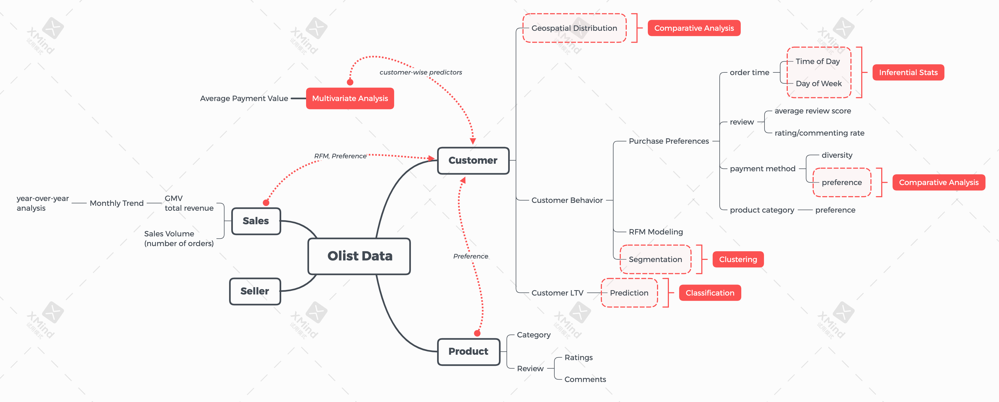

In [153]:
from IPython.display import Image, display
display(Image(filename='images/olist_problem_schema.png'))

# Data Sources

Kaggle: https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce  
The data was provided by Olist, containing multiple datasets that can be joined on certain keys. The schema is shown below:  

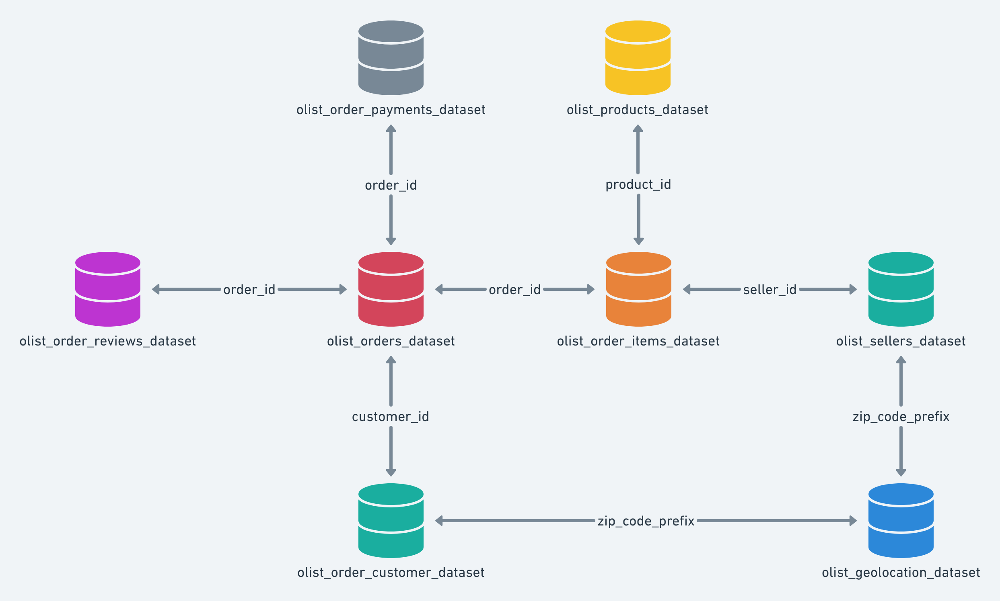

In [154]:
display(Image(filename='images/olist_dataset_schema.png'))

# I. Data Description

## I.1. Import Packages

In [1]:
! pip3 install plotly
! pip3 install folium
! pip3 install wordcloud

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from matplotlib.gridspec import GridSpec
pd.set_option('display.max_columns', 100)

import plotly.offline as py
import plotly.express as px
import plotly.graph_objs as go

import json
import requests
import folium
from folium.plugins import FastMarkerCluster, Fullscreen, MiniMap, HeatMap, HeatMapWithTime, LocateControl
from wordcloud import WordCloud
from collections import Counter
from PIL import Image

In [3]:
orders = pd.read_csv('Dataset/olist_orders_dataset.csv')
payment = pd.read_csv('Dataset/olist_order_payments_dataset.csv')
customers = pd.read_csv('Dataset/olist_customers_dataset.csv')
geolocation = pd.read_csv('Dataset/olist_geolocation_dataset.csv')
products = pd.read_csv('Dataset/olist_products_dataset.csv')
sellers = pd.read_csv('Dataset/olist_sellers_dataset.csv')
items = pd.read_csv('Dataset/olist_order_items_dataset.csv')
category = pd.read_csv('Dataset/product_category_name_translation.csv')
reviews = pd.read_csv('Dataset/olist_order_reviews_dataset.csv')


In [4]:
datasets = [orders, payment, customers, geolocation, products, sellers, items, category, reviews]
names = ['orders', 'payment', 'customers', 'geolocation', 'products', 'sellers', 'items', 'category', 'reviews']

## I.2. List Variables

In [5]:
data_info = pd.DataFrame(columns=['dataset', 'column', 'dtype'])
for name in names:
    dataset = datasets[names.index(name)]
    for col in dataset.columns:
        data_info.loc[len(data_info)] = [name, col, dataset[col].dtype]
data_info

,dataset,column,dtype
0,orders,order_id,object
1,orders,customer_id,object
2,orders,order_status,object
3,orders,order_purchase_timestamp,object
4,orders,order_approved_at,object
5,orders,order_delivered_carrier_date,object
6,orders,order_delivered_customer_date,object
7,orders,order_estimated_delivery_date,object
8,payment,order_id,object
9,payment,payment_sequential,int64


**Table Description**:  
1. olist_order_customer_dataset  
   Olist Customers  
     > customerd_id => key to the orders dataset. Each order has a unique customerd_id  
     > customers_unique_id => unique identifier of a customer  
     > customers_zip_code_prefix => first five digits of customer zip code  
     > customer_city => customer city name  
     > customer_state => customer state  
2. olist_order_dataset  
   Olist Orders  
     > order_id => unique identifier of the order  
     > customer_id => key to the customer dataset. Each order has a unique customer_id  
     > order_status => reference to the order status (delivered, shipped, etc)  
     > order_purchase_timestamp => shows the purchase timestamp  
     > order_approved_at => shows the payments approval timestamp  
     > order_delivered_carrier_state => shows the order posting timestamp. When it was handled to the logistic partner  
     > order_delivered_customer_date => shows the actual order delivery date to the customer  
     > order_estimated_delivery_date => shows the estimated delivery date that was informed to customer at the purchase moment  
3. olist_order_reviews_dataset  
   Olist Order Review  
     > review_id => unique review identifier  
     > order_id => unique order identifier  
     > review_score => note ranging from 1 to 5 given by the customer on a satisfaction survey  
     > review_comment_title => comment title from the review left by the customer, in Portuguese  
     > review_comment_message => comment message from the review left by the customer, in Portuguese  
     > review_creation_date => shows the date in which the satisfaction survey was sent to the customer  
     > review_answer_timestamp => shows satisfaction survey answer timestamp  
4. olist_order_payments_dataset  
   Olist Order Payments  
     > order_id => unique identifier of an order  
     > payment_sequential => a customer may pay an order with more than one payment method. if he does so, a sequence will be created to accomodate all payments  
     > payment_type => method of payment chosen by the customer  
     > payment_installments => number of installments chosen by the customer  
     > payment_value => transaction value  
5. olist_order_items_dataset  
   Olist Order Items  
     > order_id => order unique identifier  
     > order_item_id => sequential number identifying number of items included in the same order  
     > product_id => product unique identifier  
     > seller_id => seller unique identifier  
     > shipping_limit_date => shows the seller shipping limit date for handling the order over to the logistics partner  
     > price => item price  
     > freight_value => item freight value (if an order has more than one item the freight value is splitted between items)  
6. olist_products_dataset  
   Olist Products  
     > product_id => unique product  identifier  
     > product_category_name => root category of product, in Portuguese  
     > product_name_lenght => number of characters extracted from the product name  
     > product_description_lenght => number of characters extracted from the product product_description_lenght  
     > product_photos_qty => number of product published product_photos_qty  
     > product_weight_g => product weight measured in grams  
     > product_length_cm => product length measured in centimeters  
     > product_height_cm => product height measured in centimeters  
     > product_width_cm => product width measured in centimeters  
7. olist_sellers_dataset  
   Olist seller    
     > seller_id => seller unique identifier  
     > seller_zip_code_prefix => first 5 digits of seller zip codes  
     > seller_city => seller city name  
     > seller_state => seller state  
8. olist_geolocation_dataset  
   Olist Geolocation  
     > geolocation_zip_code_prefix => first 5 digits of zip code  
     > geolocation_lat => latitude  
     > geolocation_lng => longitude  
     > geolocation_city => city name  
     > geolocation_state => state  
9. product_category_name_translation  
   Product Category Name Translation  
     > product_category_name => category name in Portuguese  
     > product_category_name_english => category name in english  

## I.3. Inspect Datasets

In [6]:
data_inspection = pd.DataFrame({})
data_inspection['dataset'] = names
data_inspection['rows'] = [df.shape[0] for df in datasets]
data_inspection['cols'] = [df.shape[1] for df in datasets]
data_inspection['null_values'] = [df.isnull().sum().sum() for df in datasets]
data_inspection['n_cols_with_null'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]
data_inspection['cols_with_null'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]

data_inspection.style.background_gradient()

,dataset,rows,cols,null_values,n_cols_with_null,cols_with_null
0,orders,99441,8,4908,3,"order_approved_at, order_delivered_carrier_date, order_delivered_customer_date"
1,payment,103886,5,0,0,
2,customers,99441,5,0,0,
3,geolocation,1000163,5,0,0,
4,products,32951,9,2448,8,"product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm"
5,sellers,3095,4,0,0,
6,items,112650,7,0,0,
7,category,71,2,0,0,
8,reviews,99224,7,145903,2,"review_comment_title, review_comment_message"


### further inspect reviews dataset

In [7]:
reviews.shape[0], reviews.order_id.nunique(), reviews.review_id.nunique()

(99224, 98673, 98410)

In [8]:
# inspect orders with multiple reviews
multi_review_order = reviews.groupby('order_id').review_id.nunique().reset_index(name='n_reviews')
multi_review_order[multi_review_order.n_reviews > 1].sort_values('n_reviews', ascending=False)

,order_id,n_reviews
86232,df56136b8031ecd28e200bb18e6ddb2e,3
77319,c88b1d1b157a9999ce368f218a407141,3
54489,8e17072ec97ce29f0e1f111e598b0c85,3
1455,03c939fd7fd3b38f8485a0f95798f1f6,3
63428,a5507507d82c1fb664405882ed065af0,2
...,...,...
27210,468edfd1aeeeef023e6bba4943f2cdfb,2
26671,45390ff93f092f0de1524d486a172c33,2
26601,450c49623c365a4edcf0c5a2c93aa7c9,2
26500,44cb884118c81bf6db2f43cf11ab63d6,2


In [9]:
# inspect reviews correspondent to multiple orders (which is confusing)
multi_order_review = reviews.groupby('review_id').order_id.nunique().reset_index(name='n_orders')
multi_order_review[multi_order_review.n_orders > 1].sort_values('n_orders', ascending=False)

,review_id,n_orders
26600,4548534449b1f572e357211b90724f1b,3
17423,2d6ac45f859465b5c185274a1c929637,3
12172,1fb4ddc969e6bea80e38deec00393a6f,3
29612,4d0e6dd087008d1f992d25ef6e1f619f,3
75615,c444278834184f72b1484dfe47de7f97,3
...,...,...
35190,5bdf704ce1edc91bc6c73abede903d1c,2
35352,5c4bd938f98283c5d7145a9d25a89c3e,2
35466,5c99f6ff0f883ea3b283853720266109,2
35554,5ccf9e14796ecb4f98ce11d896e9f0c0,2


In [10]:
reviews[reviews.order_id == 'df56136b8031ecd28e200bb18e6ddb2e']

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
2952,c444278834184f72b1484dfe47de7f97,df56136b8031ecd28e200bb18e6ddb2e,5,NaN,NaN,2017-02-08 00:00:00,2017-02-14 13:58:48
13982,72a1098d5b410ae50fbc0509d26daeb9,df56136b8031ecd28e200bb18e6ddb2e,5,NaN,NaN,2017-02-07 00:00:00,2017-02-10 10:46:09
62728,44f3e54834d23c5570c1d010824d4d59,df56136b8031ecd28e200bb18e6ddb2e,5,NaN,NaN,2017-02-09 00:00:00,2017-02-09 09:07:28


In [11]:
reviews[reviews.review_id == 'ffb8cff872a625632ac983eb1f88843c']

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1985,ffb8cff872a625632ac983eb1f88843c,c88b1d1b157a9999ce368f218a407141,3,NaN,NaN,2017-07-22 00:00:00,2017-07-26 13:41:07
73951,ffb8cff872a625632ac983eb1f88843c,c44883fc2529b4aa03ca90e7e09d95b6,3,NaN,NaN,2017-07-22 00:00:00,2017-07-26 13:41:07


It appears that there are cases where one review_id corresponds to multiple order_id (i.e. customer wrote a single review for multiple orders),  and also cases where one order_id corresponds to multiple review_id (i.e. customer wrote multiple reviews for one single order).  
We need to take this into consideration in our feature engineering step.

# II. Data Manipulation

## II.1. Geolocation Processing

In this part, we constrained the geolocation to the Brazil region,   
and take the average of geolocation latitudes and longitudes to represent the geolocation for each zip code

In [12]:
# Using the API to bring the region to the data
r = requests.get('https://servicodados.ibge.gov.br/api/v1/localidades/mesorregioes')
content = [c['UF'] for c in json.loads(r.text)]
brazil = pd.DataFrame(content)
brazil.head()

,id,sigla,nome,regiao
0,11,RO,Rondônia,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
1,11,RO,Rondônia,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
2,12,AC,Acre,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
3,12,AC,Acre,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
4,13,AM,Amazonas,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"


In [13]:
brazil['nome_regiao'] = brazil['regiao'].apply(lambda x: x['nome'])
brazil.drop('regiao', axis=1, inplace=True)
brazil.drop_duplicates(inplace=True)

# Filter the geolocation data to the Brazilian region by constraining the lat and lng
geo = geolocation[(geolocation.geolocation_lat <= 5.27438888) & (geolocation.geolocation_lat >= -33.75116944) & (geolocation.geolocation_lng >= -73.98283055) & (geolocation.geolocation_lng <= -34.79314722)] 

# Since one zip code can have multiple lat and lng, we choose the minimum lat and lng for each zip code
geo_group = geo.groupby(by='geolocation_zip_code_prefix', as_index=False).agg({'geolocation_lat': 'mean', 'geolocation_lng': 'mean'})
geo_group.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,1001,-23.550190,-46.634024
1,1002,-23.548146,-46.634979
2,1003,-23.548994,-46.635731
3,1004,-23.549799,-46.634757
4,1005,-23.549456,-46.636733


## II.2. Timestamp Processing

only `orders` and `reviews` have timestamp data

In [14]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])

# Extracting Time attributes for purchase date
orders['order_purchase_year'] = orders['order_purchase_timestamp'].apply(lambda x: x.year)
orders['order_purchase_month'] = orders['order_purchase_timestamp'].apply(lambda x: x.month)
orders['order_purchase_month_name'] = orders['order_purchase_timestamp'].apply(lambda x: x.strftime('%b'))
orders['order_purchase_year_month'] = orders['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y%m'))
orders['order_purchase_date'] = orders['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y%m%d'))
orders['order_purchase_day'] = orders['order_purchase_timestamp'].apply(lambda x: x.day)
orders['order_purchase_dayofweek'] = orders['order_purchase_timestamp'].apply(lambda x: x.dayofweek)
orders['order_purchase_dayofweek_name'] = orders['order_purchase_timestamp'].apply(lambda x: x.strftime('%a'))
orders['order_purchase_hour'] = orders['order_purchase_timestamp'].apply(lambda x: x.hour)
orders['order_purchase_time_day'] = pd.cut(orders['order_purchase_hour'], bins=[-0.1, 6, 12, 18, 24], labels=['Dawn', 'Morning', 'Afternoon', 'Night'])

orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2017,10,Oct,201710,20171002,2,0,Mon,10,Morning
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,2018,7,Jul,201807,20180724,24,1,Tue,20,Night
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,2018,8,Aug,201808,20180808,8,2,Wed,8,Morning
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,2017,11,Nov,201711,20171118,18,5,Sat,19,Night
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,2018,2,Feb,201802,20180213,13,1,Tue,21,Night


In [15]:
reviews['review_creation_date'] = pd.to_datetime(reviews['review_creation_date'])

# Extracting Time attributes for purchase date
reviews['review_creation_year'] = reviews['review_creation_date'].apply(lambda x: x.year)
reviews['review_creation_month'] = reviews['review_creation_date'].apply(lambda x: x.month)
reviews['review_creation_month_name'] = reviews['review_creation_date'].apply(lambda x: x.strftime('%b'))
reviews['review_creation_year_month'] = reviews['review_creation_date'].apply(lambda x: x.strftime('%Y%m'))
reviews['review_creation_date'] = reviews['review_creation_date'].apply(lambda x: x.strftime('%Y%m%d'))

reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,review_creation_year,review_creation_month,review_creation_month_name,review_creation_year_month
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,20180118,2018-01-18 21:46:59,2018,1,Jan,201801
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,20180310,2018-03-11 03:05:13,2018,3,Mar,201803
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,20180217,2018-02-18 14:36:24,2018,2,Feb,201802
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,20170421,2017-04-21 22:02:06,2017,4,Apr,201704
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,20180301,2018-03-02 10:26:53,2018,3,Mar,201803


## II.3. Variable Selection

In [16]:
orders.drop(['order_approved_at', 'order_status', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date'], axis=1, inplace=True)
payment.drop(['payment_sequential', 'payment_installments'], axis=1, inplace=True)
products.drop(['product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm'], axis=1, inplace=True)

## II.4. Table Merging

In [17]:
# for sales analysis
order_payment = pd.merge(orders, payment, on='order_id')  ## need the purchase timestamp and payment value to investigate temporal trends in sales

# for customer analysis
customer_state = pd.merge(customers, brazil, left_on='customer_state', right_on='sigla')
customer_geo = pd.merge(customer_state, geo_group, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix')  
customer_rfm = pd.merge(customer_geo, order_payment, on='customer_id')  ## need the purchase timestamp and payment value to calculate RFM

order_geo = pd.merge(order_payment, customer_geo, on='customer_id')  ## need the purchase timestamp to investigate temporal trends in sales
order_review = pd.merge(orders, reviews, on='order_id', how='left')  ## left join to keep orders without reviews

# for product analysis
product_sales = pd.merge(products, items, on='product_id')
product_review = pd.merge(product_sales, reviews, on='order_id', how='left')  ## left join to keep orders without reviews
product_category = pd.merge(product_review, category, on='product_category_name', how='left')  ## left join to keep orders without category name

# for seller analysis
seller_state = pd.merge(sellers, brazil, left_on='seller_state', right_on='sigla')
seller_geo = pd.merge(seller_state, geo_group, left_on='seller_zip_code_prefix', right_on='geolocation_zip_code_prefix')
seller_sales = pd.merge(seller_geo, product_sales, on='seller_id')



In [18]:
order_payment.to_csv('Generated_Dataset/sorder_payment.csv', index=False)
customer_rfm.to_csv('Generated_Dataset/customer_rfm.csv', index=False)
order_geo.to_csv('Generated_Dataset/order_geo.csv', index=False)
order_review.to_csv('Generated_Dataset/order_review.csv', index=False)
product_review.to_csv('Generated_Dataset/product_review.csv', index=False)
product_category.to_csv('Generated_Dataset/product_category.csv', index=False)
seller_sales.to_csv('Generated_Dataset/seller_sales.csv', index=False)

## II.5. Data Inspection of Merged Datasets

In [19]:
merged_datasets = [order_payment, customer_rfm, order_geo, order_review, product_review, product_category, seller_sales]
merged_names = ['order_payment', 'customer_rfm', 'order_geo', 'order_review', 'product_review', 'product_category', 'seller_sales']

data_inspection_merged = pd.DataFrame({})
data_inspection_merged['dataset'] = merged_names
data_inspection_merged['rows'] = [df.shape[0] for df in merged_datasets]
data_inspection_merged['cols'] = [df.shape[1] for df in merged_datasets]
data_inspection_merged['null_values'] = [df.isnull().sum().sum() for df in merged_datasets]
data_inspection_merged['n_cols_with_null'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in merged_datasets]
data_inspection_merged['cols_with_null'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in merged_datasets]

data_inspection_merged.style.background_gradient()

,dataset,rows,cols,null_values,n_cols_with_null,cols_with_null
0,order_payment,103886,15,0,0,
1,customer_rfm,103598,26,0,0,
2,order_geo,103598,26,0,0,
3,order_review,99992,23,153583,10,"review_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp, review_creation_year, review_creation_month, review_creation_month_name, review_creation_year_month"
4,product_review,113314,18,174700,11,"product_category_name, review_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp, review_creation_year, review_creation_month, review_creation_month_name, review_creation_year_month"
5,product_category,113314,19,176336,12,"product_category_name, review_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp, review_creation_year, review_creation_month, review_creation_month_name, review_creation_year_month, product_category_name_english"
6,seller_sales,112397,18,1602,1,product_category_name


In [20]:
merged_data_info = pd.DataFrame(columns=['dataset', 'column', 'dtype', 'n_unique_values'])
for name in merged_names:
    dataset = merged_datasets[merged_names.index(name)]
    for col in dataset.columns:
        merged_data_info.loc[len(merged_data_info)] = [name, col, dataset[col].dtype, dataset[col].nunique()]
merged_data_info

,dataset,column,dtype,n_unique_values
0,order_payment,order_id,object,99440
1,order_payment,customer_id,object,99440
2,order_payment,order_purchase_timestamp,datetime64[ns],98874
3,order_payment,order_purchase_year,int64,3
4,order_payment,order_purchase_month,int64,12
...,...,...,...,...
140,seller_sales,order_id,object,98450
141,seller_sales,order_item_id,int64,21
142,seller_sales,shipping_limit_date,object,93121
143,seller_sales,price,float64,5959


Some of the product category names and review information (including title and message) are missing, we keep them for subsequent feature engineering.

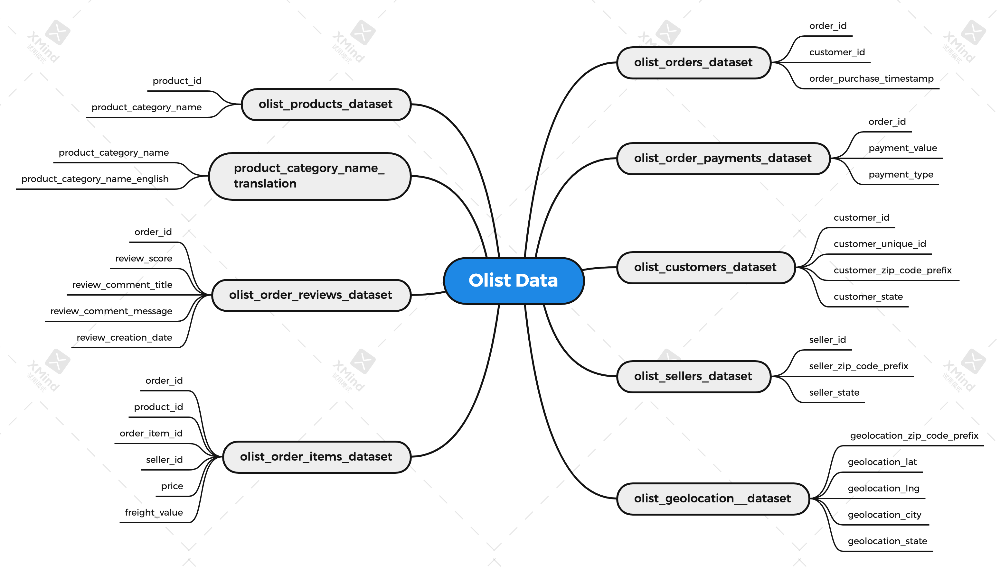

In [155]:
display(Image(filename='images/olist_variable_selection.png'))

# III. Feature Engineering

In this part, we construct useful features that indicates customer properties for subsequent analysis and modeling, including:  
* Recency, Frequency, and Monetary Features;  
* Review Features;  
    * customer average review scores;  
    * customer review rate:  
        * rating rate: (# review scores made) / (# orders placed);  
        * commenting rate: (# review comments made) / (# orders placed);  
* Payment Features:  
    * customer most frequently used payment method;  
    * number of payment method customer used;  
    * average payment value: total payment value / # (items bought);  
    * average order value: total payment value / # (orders placed);  
* Purchased Product Features: most frequently purchased product category

## III.1. RFM Features

In [21]:
customer_rfm.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,id,sigla,nome,nome_regiao,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,order_id,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,payment_type,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017,5,May,201705,20170516,16,1,Tue,15,Afternoon,credit_card,146.87
1,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,95261f608a64bbbe760a212b4d48a4ee,2018-06-15 20:07:13,2018,6,Jun,201806,20180615,15,4,Fri,20,Night,credit_card,94.77
2,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,9444fa2ab50a3f5af63b48be297eda24,2017-09-09 15:40:00,2017,9,Sep,201709,20170909,9,5,Sat,15,Afternoon,credit_card,62.50
3,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,dceb8e88274c6f42a88a76ed979eb817,2018-03-26 12:04:55,2018,3,Mar,201803,20180326,26,0,Mon,12,Morning,credit_card,32.69
4,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,6ee1cea1b2edcc713f83ebfbccbc57f9,2018-07-29 20:39:20,2018,7,Jul,201807,20180729,29,6,Sun,20,Night,credit_card,77.01


In [54]:
customer_rfm['order_purchase_timestamp'] = pd.to_datetime(customer_rfm['order_purchase_timestamp'])

rfm = customer_rfm.groupby('customer_unique_id').agg({'order_purchase_timestamp': 'max'}).reset_index()
rfm['Recency'] = (rfm['order_purchase_timestamp'].max() - rfm['order_purchase_timestamp']).dt.days
rfm['Frequency'] = customer_rfm.groupby('customer_unique_id').order_id.nunique().reset_index(name='Frequency')['Frequency']  ## Note: need to count unique order ids, since one customer can have multiple items in one order
rfm['Monetary'] = customer_rfm.groupby('customer_unique_id').agg({'payment_value': 'sum'}).reset_index()['payment_value']

In [55]:
rfm.head()

,customer_unique_id,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,163,1,27.19
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,336,1,196.89


In [56]:
rfm[['Recency', 'Frequency', 'Monetary']].describe()

,Recency,Frequency,Monetary
count,95826.000000,95826.000000,95826.000000
mean,287.758656,1.034803,166.593165
std,153.429504,0.214403,231.497146
min,0.000000,1.000000,0.000000
25%,163.000000,1.000000,63.120000
50%,268.000000,1.000000,108.000000
75%,397.000000,1.000000,183.520000
max,772.000000,17.000000,13664.080000


## III.2. Customer Review Features

As we said before, we do not handle the 'one review_id - multiple order_id' and 'one order_id - multiple review_id' cases further, which means we allow such cases in our dataset and calculations

In [25]:
customer_review = pd.merge(order_review, customers, on='customer_id')

In [26]:
# has review score or not
customer_review['has_review_score'] = customer_review['review_score'].apply(lambda x: 1 if x > 0 else 0)

# has review comment (title and message any) or not
customer_review['has_review_comment'] = customer_review['review_comment_title'].notnull() | customer_review['review_comment_message'].notnull()

In [27]:
customer_review_agg = customer_review.groupby('customer_unique_id').agg({
    'review_score': 'mean', 'order_id': 'count','has_review_score': 'sum', 'has_review_comment': 'sum'}).reset_index().rename(columns={
    'review_score': 'avg_review_score', 'order_id': 'order_counts', 'has_review_score': 'review_score_counts', 'has_review_comment': 'review_comment_counts'})

In [28]:
customer_review_agg['rating_rate'] = customer_review_agg['review_score_counts'] / customer_review_agg['order_counts']
customer_review_agg['comment_rate'] = customer_review_agg['review_comment_counts'] / customer_review_agg['order_counts']

有空可以加average letters used in review comments of each customer

##  III.3. Customer Payment Features

In [29]:
order_payment.head()

,order_id,customer_id,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,payment_type,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017,10,Oct,201710,20171002,2,0,Mon,10,Morning,credit_card,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017,10,Oct,201710,20171002,2,0,Mon,10,Morning,voucher,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017,10,Oct,201710,20171002,2,0,Mon,10,Morning,voucher,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018,7,Jul,201807,20180724,24,1,Tue,20,Night,boleto,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018,8,Aug,201808,20180808,8,2,Wed,8,Morning,credit_card,179.12


One order_id may be correspondent to multiple payment types, as is shown in order_payment index0 - index2  
We use customer_rfm in this part, since it joins customers with order_payment on order_id

In [30]:
customer_rfm.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,id,sigla,nome,nome_regiao,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,order_id,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,payment_type,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017,5,May,201705,20170516,16,1,Tue,15,Afternoon,credit_card,146.87
1,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,95261f608a64bbbe760a212b4d48a4ee,2018-06-15 20:07:13,2018,6,Jun,201806,20180615,15,4,Fri,20,Night,credit_card,94.77
2,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,9444fa2ab50a3f5af63b48be297eda24,2017-09-09 15:40:00,2017,9,Sep,201709,20170909,9,5,Sat,15,Afternoon,credit_card,62.50
3,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,dceb8e88274c6f42a88a76ed979eb817,2018-03-26 12:04:55,2018,3,Mar,201803,20180326,26,0,Mon,12,Morning,credit_card,32.69
4,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,6ee1cea1b2edcc713f83ebfbccbc57f9,2018-07-29 20:39:20,2018,7,Jul,201807,20180729,29,6,Sun,20,Night,credit_card,77.01


In [31]:
customer_pay = customer_rfm.groupby('customer_unique_id').agg({
    'payment_type': lambda x: x.value_counts().index[0]}).reset_index().rename(columns={'payment_type': 'most_frequent_payment_types'})

customer_pay['n_payment_types'] = customer_rfm.groupby('customer_unique_id').payment_type.nunique().reset_index()['payment_type']

In [32]:
customer_pay['average_payment_value'] = customer_rfm.groupby('customer_unique_id').agg({'payment_value': 'mean'}).reset_index()['payment_value']
customer_pay['average_order_value'] = customer_rfm.groupby('customer_unique_id').agg({'payment_value': 'sum'}).reset_index()['payment_value']/customer_rfm.groupby('customer_unique_id').agg({'order_id': 'nunique'}).reset_index()['order_id']

## III.4. Customer Product Features

In [33]:
order_customer = pd.merge(orders, customers, on='customer_id')
customer_product = pd.merge(order_customer, product_category, on='order_id', how='left')

In [34]:
customer_product_agg = customer_product.groupby('customer_unique_id').agg({
    'product_category_name_english': lambda x: x.value_counts().index[0] if x.notnull().sum() > 0 else np.nan}).reset_index().rename(columns={
    'product_category_name_english': 'most_frequent_product_category'})

In [35]:
customer_product_agg.head()

,customer_unique_id,most_frequent_product_category
0,0000366f3b9a7992bf8c76cfdf3221e2,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,health_beauty
2,0000f46a3911fa3c0805444483337064,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,telephony
4,0004aac84e0df4da2b147fca70cf8255,telephony


In [36]:
customer_product_agg.most_frequent_product_category.value_counts().index

Index(['bed_bath_table', 'health_beauty', 'sports_leisure',
       'computers_accessories', 'furniture_decor', 'housewares',
       'watches_gifts', 'telephony', 'auto', 'toys', 'cool_stuff',
       'garden_tools', 'perfumery', 'baby', 'electronics', 'stationery',
       'fashion_bags_accessories', 'pet_shop', 'office_furniture',
       'consoles_games', 'luggage_accessories',
       'construction_tools_construction', 'home_appliances',
       'musical_instruments', 'small_appliances', 'books_general_interest',
       'home_construction', 'food', 'furniture_living_room', 'audio',
       'home_confort', 'drinks', 'market_place', 'books_technical',
       'air_conditioning', 'kitchen_dining_laundry_garden_furniture',
       'fashion_shoes', 'industry_commerce_and_business',
       'construction_tools_lights', 'home_appliances_2', 'food_drink',
       'fixed_telephony', 'art', 'costruction_tools_garden',
       'agro_industry_and_commerce', 'computers', 'construction_tools_safety',
      

**Categorize the product categories into broader categories**  

* Home & Living 

* Beauty & Fashion 

* Electronics  

* Leisure & Sports   

* Tools  

In [37]:
HomeLiving = ['home_appliances','home_appliances_2','small_appliances','bed_bath_table', 'furniture_decor', 'housewares', 'garden_tools', 'office_furniture', 'home_construction', 'furniture_living_room', 'home_confort', 'kitchen_dining_laundry_garden_furniture', 'furniture_bedroom', 'small_appliances_home_oven_and_coffee', 'home_comfort_2', 'furniture_mattress_and_upholstery', 'la_cuisine','food','drinks','food_drink','security_and_services']
BeautyFashion = ['health_beauty', 'perfumery', 'baby', 'diapers_and_hygiene', 'fashion_bags_accessories',  'pet_shop', 'luggage_accessories', 'fashion_shoes', 'fashion_underwear_beach', 'fashion_male_clothing', 'fashio_female_clothing', 'fashion_sport', 'fashion_childrens_clothes', 'arts_and_craftmanship']
Electronics = ['computers_accessories', 'watches_gifts', 'telephony', 'fixed_telephony','electronics', 'consoles_games', 'audio', 'computers', 'tablets_printing_image', 'cine_photo','air_conditioning']
LeisureEntertainment = ['sports_leisure', 'toys', 'cool_stuff','pet_shop', 'musical_instruments', 'art', 'flowers', 'party_supplies', 'arts_and_craftmanship', 'cds_dvds_musicals', 'music', 'christmas_supplies', 'dvds_blu_ray', 'books_imported', 'books_general_interest', 'books_technical', 'cds_dvds_musicals', 'music']
Tools = ['stationery','auto', 'construction_tools_construction', 'industry_commerce_and_business', 'construction_tools_lights', 'construction_tools_safety', 'signaling_and_security', 'costruction_tools_garden', 'agro_industry_and_commerce', 'costruction_tools_tools','market_place']

customer_product_agg['product_category_group'] = customer_product_agg['most_frequent_product_category'].apply(lambda x: 'Home & Living' if x in HomeLiving else ('Beauty & Fashion' if x in BeautyFashion else ('Electronics' if x in Electronics else ('Leisure & Entertainment' if x in LeisureEntertainment else ('Tools' if x in Tools else 'Missing')))))
## 'Missing' denotes missing values


In [38]:
customer_product_agg.head()

,customer_unique_id,most_frequent_product_category,product_category_group
0,0000366f3b9a7992bf8c76cfdf3221e2,bed_bath_table,Home & Living
1,0000b849f77a49e4a4ce2b2a4ca5be3f,health_beauty,Beauty & Fashion
2,0000f46a3911fa3c0805444483337064,stationery,Tools
3,0000f6ccb0745a6a4b88665a16c9f078,telephony,Electronics
4,0004aac84e0df4da2b147fca70cf8255,telephony,Electronics


In [39]:
customer_product_agg.product_category_group.value_counts()

product_category_group
Home & Living              29366
Electronics                20628
Beauty & Fashion           19315
Leisure & Entertainment    16555
Tools                       8224
Missing                     2008
Name: count, dtype: int64

## III.5. Merge the Engineered Features

In [57]:
# Inspection

merged_datasets = [customer_review_agg, customer_pay, customer_product_agg, rfm]
merged_names = ['customer_review_agg', 'customer_pay', 'customer_product_agg', 'rfm']

data_inspection_merged = pd.DataFrame({})
data_inspection_merged['dataset'] = merged_names
data_inspection_merged['rows'] = [df.shape[0] for df in merged_datasets]
data_inspection_merged['cols'] = [df.shape[1] for df in merged_datasets]
data_inspection_merged['null_values'] = [df.isnull().sum().sum() for df in merged_datasets]
data_inspection_merged['n_cols_with_null'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in merged_datasets]
data_inspection_merged['cols_with_null'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in merged_datasets]

data_inspection_merged.style.background_gradient()

,dataset,rows,cols,null_values,n_cols_with_null,cols_with_null
0,customer_review_agg,96096,7,716,1,avg_review_score
1,customer_pay,95826,5,0,0,
2,customer_product_agg,96096,3,2008,1,most_frequent_product_category
3,rfm,95826,5,0,0,


In [58]:
customer_agg = pd.merge(customer_review_agg, customer_pay, on='customer_unique_id')
customer_agg = pd.merge(customer_agg, customer_product_agg, on='customer_unique_id')
customer_agg = pd.merge(customer_agg, rfm, on='customer_unique_id')
customer_agg.head()

,customer_unique_id,avg_review_score,order_counts,review_score_counts,review_comment_counts,rating_rate,comment_rate,most_frequent_payment_types,n_payment_types,average_payment_value,average_order_value,most_frequent_product_category,product_category_group,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,1,1,1,1.0,1.0,credit_card,1,141.90,141.90,bed_bath_table,Home & Living,2018-05-10 10:56:27,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,1,1,0,1.0,0.0,credit_card,1,27.19,27.19,health_beauty,Beauty & Fashion,2018-05-07 11:11:27,163,1,27.19
2,0000f46a3911fa3c0805444483337064,3.0,1,1,0,1.0,0.0,credit_card,1,86.22,86.22,stationery,Tools,2017-03-10 21:05:03,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,1,1,1,1.0,1.0,credit_card,1,43.62,43.62,telephony,Electronics,2017-10-12 20:29:41,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,5.0,1,1,0,1.0,0.0,credit_card,1,196.89,196.89,telephony,Electronics,2017-11-14 19:45:42,336,1,196.89


In [59]:
customer_agg.to_csv('Generated_Dataset/customer_agg.csv', index=False)

In [60]:
customer_review_agg.to_csv('Generated_Dataset/customer_review_agg.csv', index=False)
customer_pay.to_csv('Generated_Dataset/customer_pay.csv', index=False)
customer_product_agg.to_csv('Generated_Dataset/customer_product_agg.csv', index=False)
rfm.to_csv('Generated_Dataset/rfm.csv', index=False)

# IV. Data Visualization

## IV.1. Customer Geospatial Distribution

Understanding the geospatial distribution of customers enables Olist to tailor its marketing efforts to specific regions, and also helps in analyzing competition in different regions, allowing for more strategic decision-making.  
We use the distribution of **Number of Customer Orders** to represent the distribution of customers

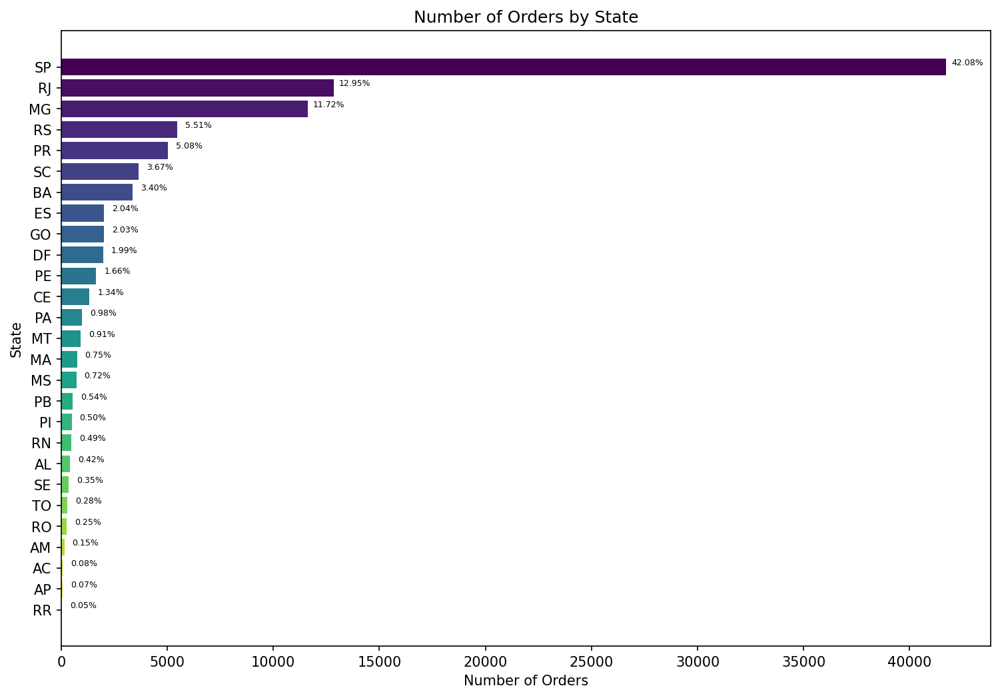

In [44]:
# Customer Orders by State

orders_ct = order_geo.groupby('customer_state').agg({'order_id': 'nunique'}).sort_values(by='order_id', ascending=True)  ## usingn nunique to count unique order ids
orders_ct.rename(columns={'order_id': 'n_orders'}, inplace=True)

colors = plt.cm.viridis(np.linspace(1, 0, len(orders_ct)))

total = sum(orders_ct.n_orders)
percentages = [f"{(value / total * 100):.2f}%" for value in orders_ct.n_orders]

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (12,8)
plt.rcParams["figure.dpi"] = 150

bars = plt.barh(orders_ct.index, orders_ct.n_orders, color=colors)

for bar, value, percentage in zip(bars, orders_ct.n_orders, percentages):
    xval = bar.get_width()
    plt.text(xval + 1000, bar.get_y() + bar.get_height()/2, f"{percentage}", ha='center', va='bottom', fontsize=6)

plt.ylabel('State')
plt.xlabel('Number of Orders')
plt.title('Number of Orders by State')
plt.show()

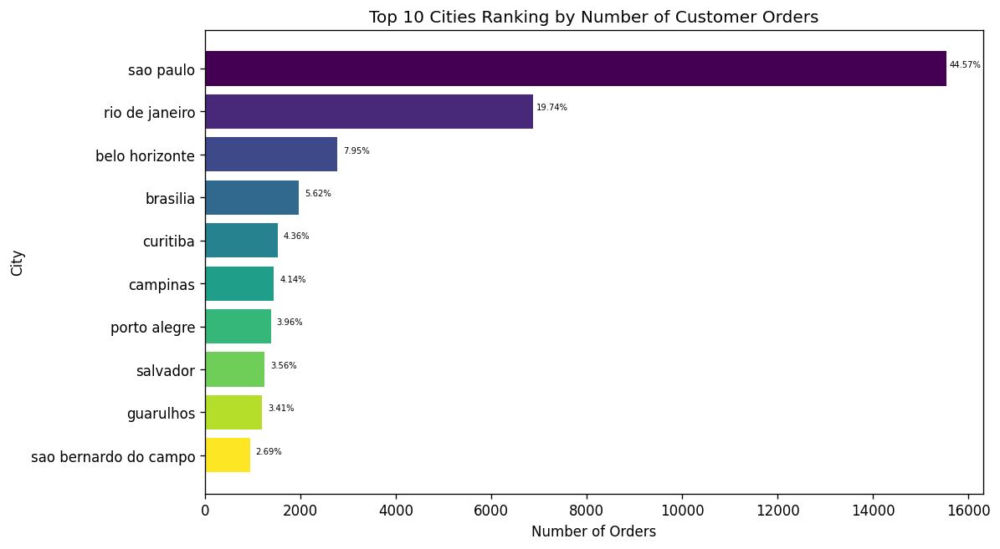

In [45]:
# Top 10 Customer Orders by City

orders_ct_city = order_geo.groupby('customer_city').agg({'order_id': 'nunique'}).sort_values(by='order_id', ascending=False).head(10)  ## usingn nunique to count unique order ids
orders_ct_city.rename(columns={'order_id': 'n_orders'}, inplace=True)
orders_ct_city.sort_values(by='n_orders', ascending=True, inplace=True)

colors = plt.cm.viridis(np.linspace(1, 0, len(orders_ct_city)))

total = sum(orders_ct_city.n_orders)
percentages = [f"{(value / total * 100):.2f}%" for value in orders_ct_city.n_orders]

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["figure.dpi"] = 120

bars = plt.barh(orders_ct_city.index, orders_ct_city.n_orders, color=colors)

for bar, value, percentage in zip(bars, orders_ct_city.n_orders, percentages):
    xval = bar.get_width()
    plt.text(xval + 400, bar.get_y() + bar.get_height()/2, f"{percentage}", ha='center', va='bottom', fontsize=6)

plt.ylabel('City')
plt.xlabel('Number of Orders')
plt.title('Top 10 Cities Ranking by Number of Customer Orders')
plt.show()

In [46]:
# Interactive Map of Customer Order Locations

lats = list(customer_geo['geolocation_lat'].values)
longs = list(customer_geo['geolocation_lng'].values)
locations = list(zip(lats, longs))

customer_map = folium.Map(location=[-15, -50], zoom_start=4.0)

FastMarkerCluster(data=locations).add_to(customer_map)
HeatMap(data=locations).add_to(customer_map)

customer_map.save('customer_geomap.html')

customer_map

### Summary:   
From above we can see that São Paulo state has the highest number of orders. São Paulo is the most populous and wealthiest state in Brazil, whose GDP accounts for approximately one-third of Brazil's total, reflecting a high concentration of purchasing power. Several actionable insights are:  
* Olist can focus on strengthening partnerships with local logistics providers within São Paulo to enhance delivery efficiency and service quality.  
* Olist can analyze purchasing patterns within São Paulo to offer personalized recommendations, promotions, and products that cater to the local market's preferences.

## IV.2. Customer Purchase Preferences

### 2.1 Purchase Preference By Time
* By Time of Day  
* By Day of Week

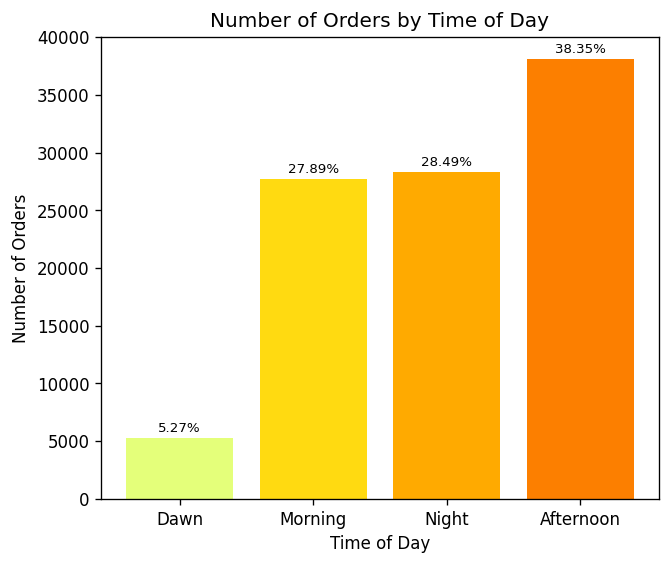

In [47]:
# By Time of Day

order_time_day = order_payment.groupby('order_purchase_time_day').agg({'order_id': 'nunique'}).sort_values(by='order_id', ascending=True)
order_time_day.rename(columns={'order_id': 'n_orders'}, inplace=True)

colors = plt.cm.Wistia(np.linspace(0, 1, len(order_time_day)))

total = sum(order_time_day.n_orders)
percentages = [f"{(value / total * 100):.2f}%" for value in order_time_day.n_orders]

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (6,5)
plt.rcParams["figure.dpi"] = 120

bars = plt.bar(order_time_day.index, order_time_day.n_orders, color=colors)

for bar, value, percentage in zip(bars, order_time_day.n_orders, percentages):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 300, f"{percentage}", ha='center', va='bottom', fontsize=8)

plt.ylabel('Number of Orders')
plt.xlabel('Time of Day')
plt.title('Number of Orders by Time of Day')

plt.show()

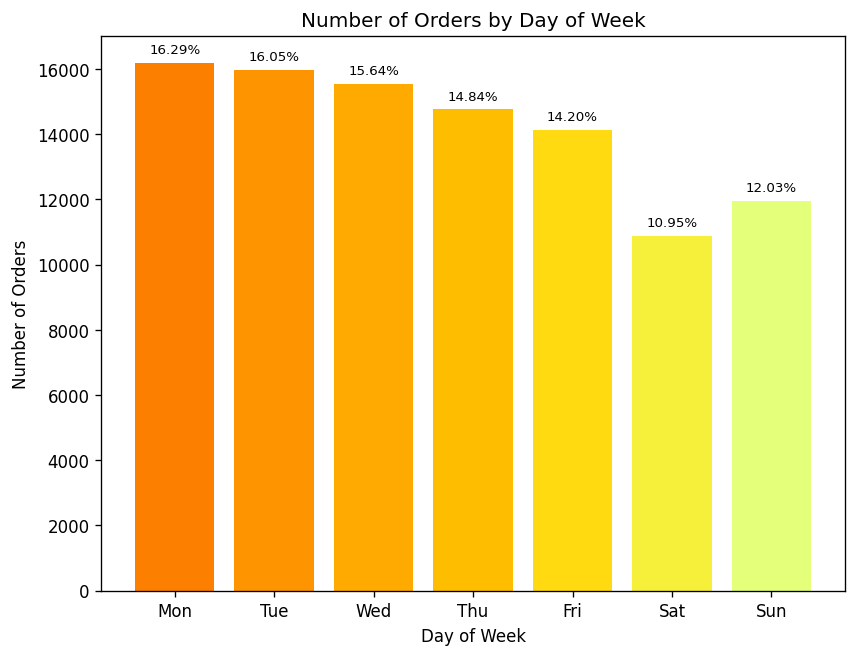

In [48]:
# By Day of Week

order_dayofweek = order_payment.groupby('order_purchase_dayofweek_name').agg({'order_id': 'nunique'}).reindex(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
order_dayofweek.rename(columns={'order_id': 'n_orders'}, inplace=True)

colors = plt.cm.Wistia(np.linspace(1, 0, len(order_dayofweek)))

total = sum(order_dayofweek.n_orders)
percentages = [f"{(value / total * 100):.2f}%" for value in order_dayofweek.n_orders]

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (8,6)
plt.rcParams["figure.dpi"] = 120

bars = plt.bar(order_dayofweek.index, order_dayofweek.n_orders, color=colors)

for bar, value, percentage in zip(bars, order_dayofweek.n_orders, percentages):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 200, f"{percentage}", ha='center', va='bottom', fontsize=8)

plt.ylabel('Number of Orders')
plt.xlabel('Day of Week')
plt.title('Number of Orders by Day of Week')

plt.show()


### 2.2 Purchase Preference By Payment Method

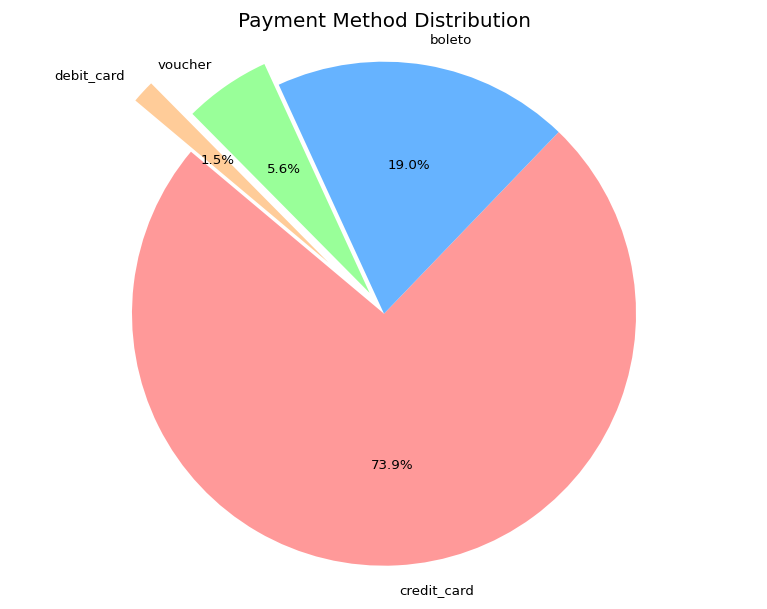

In [49]:
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']

order_payment.payment_type.value_counts().head(4).plot.pie(colors=colors, autopct='%1.1f%%', startangle=140, textprops={'fontsize': 8}, explode=(0,0,0.1,0.3))

plt.axis('equal')
plt.title('Payment Method Distribution')
plt.ylabel('')
plt.show()

### Summary: 

From above we can see that customers generally prefer to purchase in the afternoons compared with dawns, prefer to purchase on weekdays compared with weekends, and prefer to use credit card for payment. Some actionable insights:  
* Traffic is heavier in afternoons and on weekdays, so Olist should put more efforts on optimizing the latency of websites and transaction reliability during these peak times, and also could schedule more customer support staff to handle inquiries and issues more promptly.  
* Olist should develop weekend-specific strategies to improve weekend engagement and fully exploit the potential of weenkends, such as weekend-only deals or previews of upcoming week's promotions.
* High usage of credit cards emphasizes the importance of secure transactions, and also, Olist could partner with credit card companies to offer exclusive discounts and cashback to enhance customer retention.


## IV.3. Monthly GMV Trend Analysis

GMV is the total value of merchandise sold over a certain time period through the platform. It is a popular **North-Star Metric** for e-commerce platforms, because it directly reflects the volume of business being conducted. For a marketplace like Olist, which connects sellers and buyers, GMV can be a clear indicator of the platform's health and growth.  
Note: We included freight values in calculating GMV, i.e. we used the sum of payment values to represent GMV of Olist.

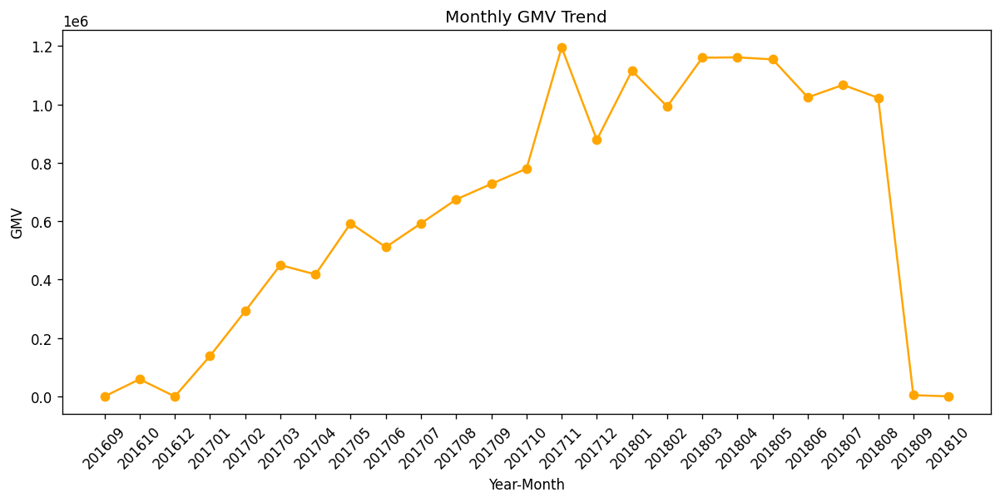

In [50]:
monthly_gmv = order_payment.groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (12,5)
plt.rcParams["figure.dpi"] = 120

plt.plot(monthly_gmv.index, monthly_gmv.payment_value, marker='o', linestyle='-', color='orange')
plt.xticks(rotation=45)
plt.xlabel('Year-Month')
plt.ylabel('GMV')
plt.title('Monthly GMV Trend')

plt.show()

From above we can see that GMV data in 2016 and after 09/2018 are suspicious. Let's decompose the GMV by payment methods to dive deep into the root cause:

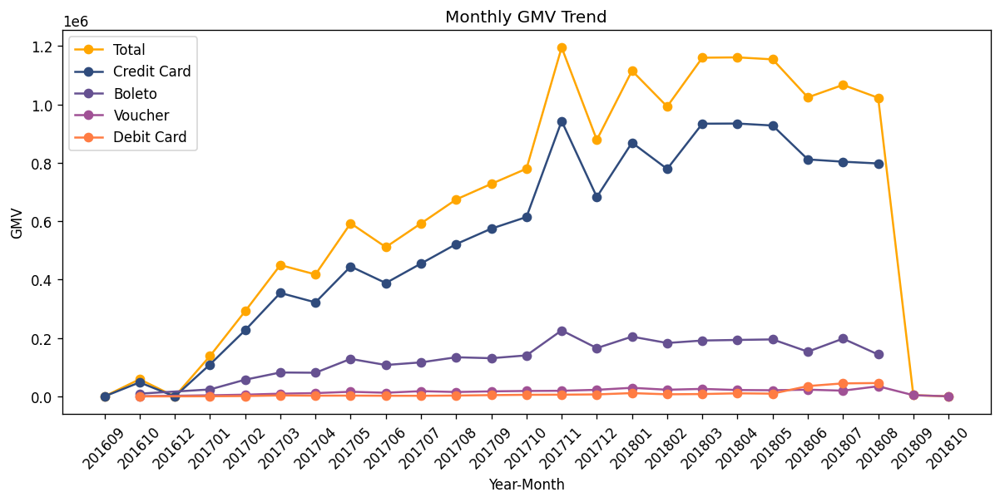

In [51]:
# Monthly GMV Trend by Payment Type
monthly_gmv_credit_card = order_payment.query('payment_type == "credit_card"').groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()
monthly_gmv_boleto = order_payment.query('payment_type == "boleto"').groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()
monthly_gmv_voucher = order_payment.query('payment_type == "voucher"').groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()
monthly_gmv_debit_card = order_payment.query('payment_type == "debit_card"').groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (12,5)
plt.rcParams["figure.dpi"] = 120


plt.plot(monthly_gmv.index, monthly_gmv.payment_value, marker='o', linestyle='-', color='#ffa600')
plt.plot(monthly_gmv_credit_card.index, monthly_gmv_credit_card.payment_value, marker='o', linestyle='-', color='#2f4b7c')
plt.plot(monthly_gmv_boleto.index, monthly_gmv_boleto.payment_value, marker='o', linestyle='-', color='#665191')
plt.plot(monthly_gmv_voucher.index, monthly_gmv_voucher.payment_value, marker='o', linestyle='-', color='#a05195')
plt.plot(monthly_gmv_debit_card.index, monthly_gmv_debit_card.payment_value, marker='o', linestyle='-', color='#ff7c43')

plt.legend(['Total', 'Credit Card', 'Boleto', 'Voucher', 'Debit Card'])
plt.xticks(rotation=45)
plt.xlabel('Year-Month')
plt.ylabel('GMV')
plt.title('Monthly GMV Trend')

plt.show()

So we found out that the GMV after 08/2018 is only composed of 'Voucher' payments, which is pretty weird.  
To ensure the effectiveness, we remove these data, i.e.  
We will be focusing on data between 01/2017 and 08/2018 in the following year-over-year analyses. 

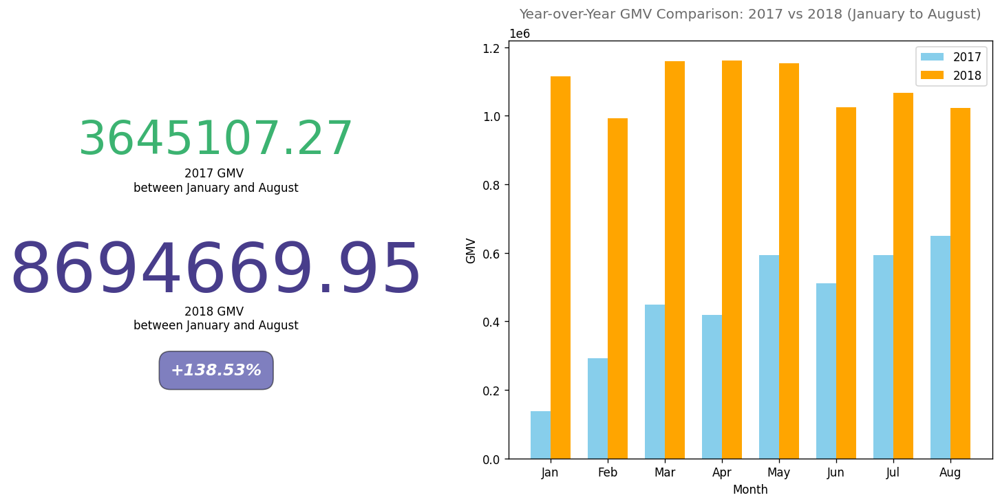

In [52]:
# Year-over-Year GMV Analysis: 2017 vs 2018 (Jan - Aug)

fig = plt.figure(constrained_layout=True, figsize=(12, 6))

gs = GridSpec(1, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])


order_payment_17 = order_payment.query('order_purchase_timestamp >= "2017-01-01" and order_purchase_timestamp <= "2017-08-31"')
order_payment_18 = order_payment.query('order_purchase_timestamp >= "2018-01-01" and order_purchase_timestamp <= "2018-08-31"')

monthly_gmv_17 = order_payment_17.groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()
monthly_gmv_18 = order_payment_18.groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()

ax1.text(0.00, 0.73, f'{round(order_payment_17.payment_value.sum(), 2)}', fontsize=40, color='mediumseagreen', ha='center')
ax1.text(0.00, 0.64, '2017 GMV \nbetween January and August', fontsize=10, ha='center')
ax1.text(0.00, 0.40, f'{round(order_payment_18.payment_value.sum(), 2)}', fontsize=60, color='darkslateblue', ha='center')
ax1.text(0.00, 0.31, '2018 GMV \nbetween January and August', fontsize=10, ha='center')
ax1.text(0.00, 0.20, f'+{round(100*(order_payment_18.payment_value.sum()-order_payment_17.payment_value.sum())/order_payment_17.payment_value.sum(), 2)}%', 
         fontsize=14, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax1.axis('off')

bar_width = 0.35
ax2.bar(np.arange(8), monthly_gmv_17.payment_value.values, bar_width, color='skyblue')
ax2.bar(np.arange(8)+bar_width, monthly_gmv_18.payment_value.values, bar_width, color='orange')

month_label = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug']
ax2.set_xticks(np.arange(8)+bar_width/2)
ax2.set_xticklabels(month_label)
ax2.set_xlabel('Month')
ax2.set_ylabel('GMV')
ax2.set_title('Year-over-Year GMV Comparison: 2017 vs 2018 (January to August)', size=12, color='dimgrey', pad=20)
ax2.legend(['2017', '2018'])


plt.show()


### Summary:
Above indicates that the GMV of Olist in 2018 was 138% higher than 2017, with each month showing a year-over-year growth, presenting a picture of robust and accelerating growth during this period. This substantial increase in GMV suggests putting a stronger focus on customer acquisition, platform technology improvements, and a potential of market expansion. 


# V. Statistical Analysis

In this part, we utilized statistical and graphical analytic methods to investigate into Olist Data, focusing on the customer-wise Data, to investigate into customer purchase preferences  


**Note:** We incoporated graphical analysis in each part of following statistical analysis, aiding statistical methods with data visualization.

## V.1. Descriptive Statistics

### V.1.1. Customer RFM 

In [2]:
rfm = pd.read_csv('Generated_Dataset/rfm.csv')

In [3]:
rfm.head()

,customer_unique_id,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,163,1,27.19
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,336,1,196.89


In [4]:
rfm[['Recency', 'Frequency', 'Monetary']].describe()

,Recency,Frequency,Monetary
count,95826.000000,95826.000000,95826.000000
mean,287.758656,1.034803,166.593165
std,153.429504,0.214403,231.497146
min,0.000000,1.000000,0.000000
25%,163.000000,1.000000,63.120000
50%,268.000000,1.000000,108.000000
75%,397.000000,1.000000,183.520000
max,772.000000,17.000000,13664.080000


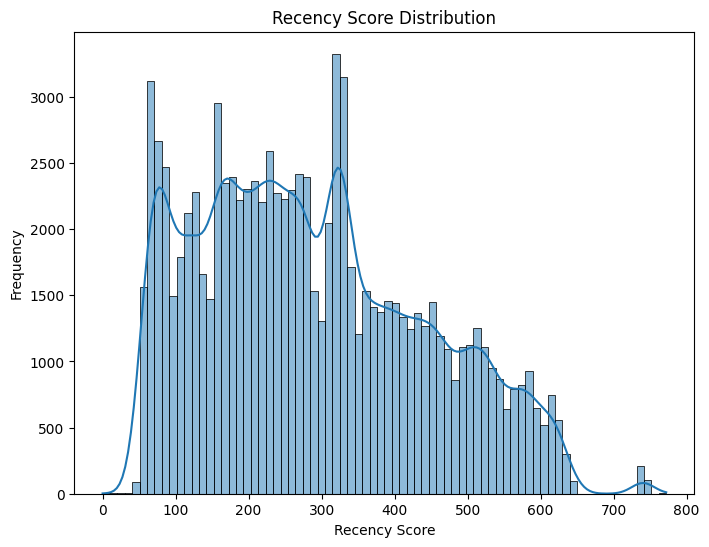

In [63]:
# Histogram of Recency

plt.figure(figsize=(8, 6))
sns.histplot(rfm['Recency'], kde=True)
plt.xlabel('Recency Score')
plt.ylabel('Frequency')
plt.title('Recency Score Distribution')
plt.show()


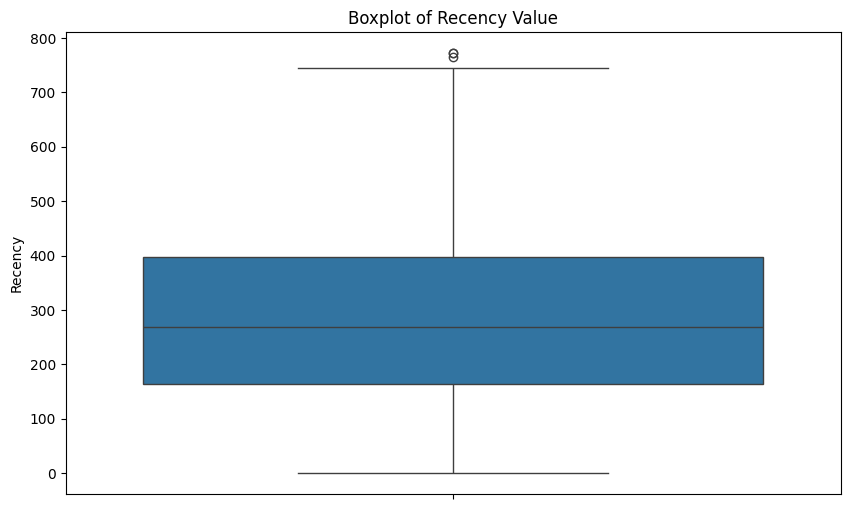

In [8]:
plt.figure(figsize=(10, 6))
sns.boxplot(rfm.Recency)
plt.title('Boxplot of Recency Value')
plt.show()

In [71]:
rfm.Frequency.value_counts(normalize=True).sort_index()

Frequency
1     0.968818
2     0.028562
3     0.002108
4     0.000313
5     0.000083
6     0.000063
7     0.000031
9     0.000010
17    0.000010
Name: proportion, dtype: float64

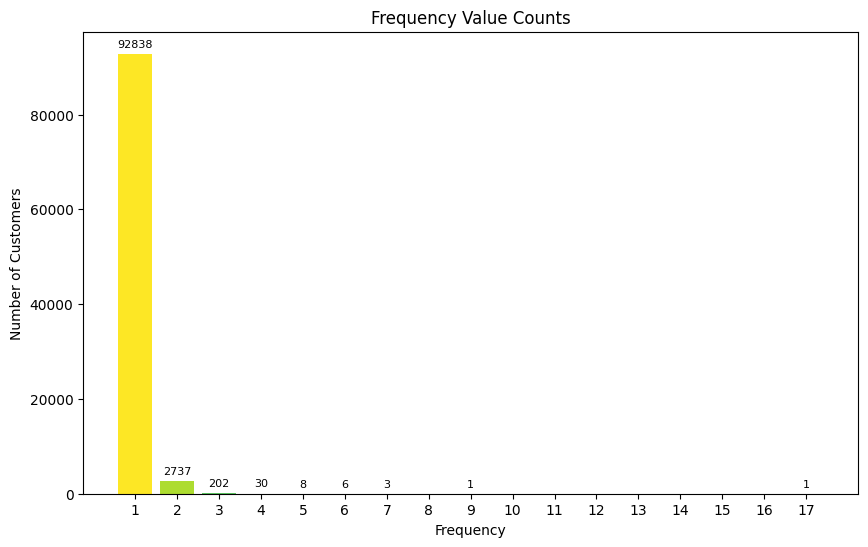

In [70]:
# barplot of Frequency 

plt.figure(figsize=(10, 6))

colors = plt.cm.viridis(np.linspace(1, 0, len(rfm.Frequency.value_counts())))

plt.bar(rfm.Frequency.value_counts().index, rfm.Frequency.value_counts().values, color=colors)

for i, v in zip(rfm.Frequency.value_counts().index, rfm.Frequency.value_counts().values):
    plt.text(i, v+1000, str(v), ha='center', va='bottom', fontsize=8)

plt.title('Frequency Value Counts')
plt.xticks(np.arange(1, 18, step=1))
plt.xlabel('Frequency')
plt.ylabel('Number of Customers')
plt.show()

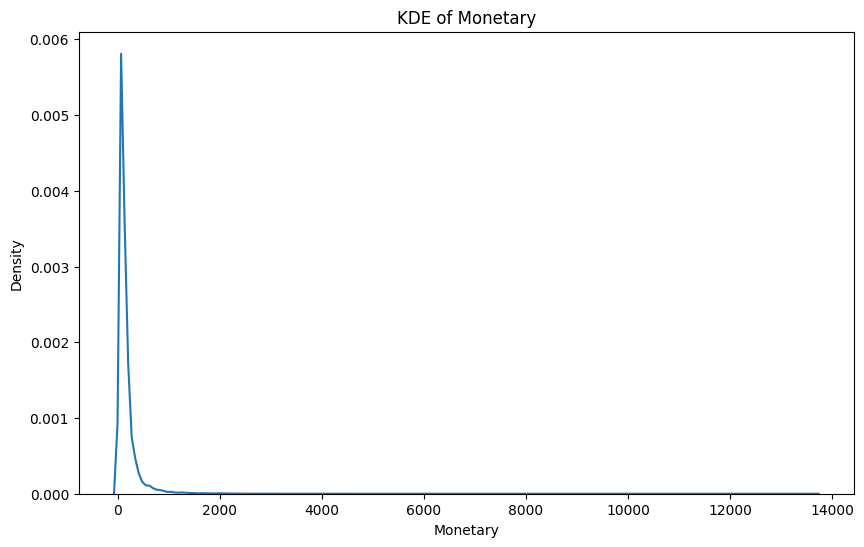

In [6]:
# KDE of Monetary

plt.figure(figsize=(10, 6))
sns.kdeplot(rfm.Monetary)
plt.title('KDE of Monetary')
plt.xlabel('Monetary')
plt.ylabel('Density')
plt.show()


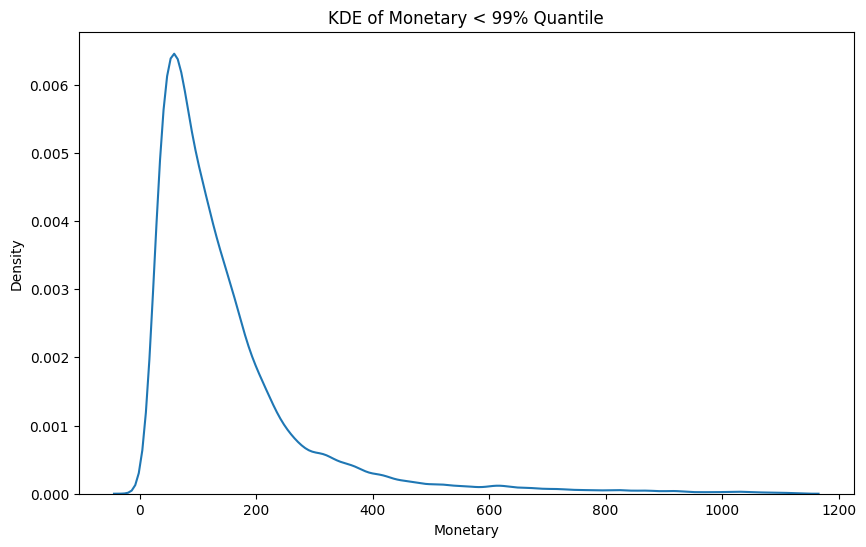

In [5]:
# KDE of Monetary before 99% quantile

plt.figure(figsize=(10, 6))
sns.kdeplot(rfm[rfm.Monetary < rfm.Monetary.quantile(0.99)].Monetary)
plt.title('KDE of Monetary < 99% Quantile')
plt.xlabel('Monetary')
plt.ylabel('Density')
plt.show()

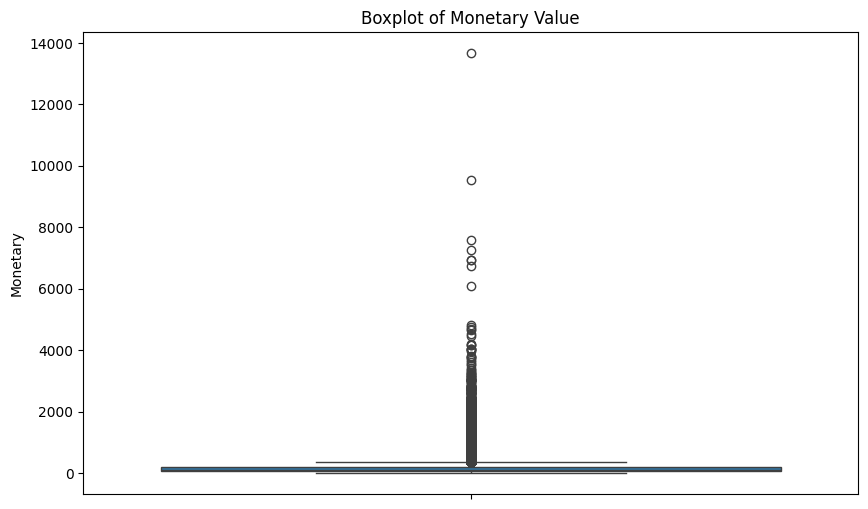

In [7]:
# boxplot of Monetary
plt.figure(figsize=(10, 6))
sns.boxplot(rfm.Monetary)
plt.title('Boxplot of Monetary Value')
plt.show()

#### Summary

Through descriptive analysis of RFM values, we found that:  
* Recency value is primarily concentrated between 150 and 400, a little bit right-skewed, indicating that most of our customers had their latest purchase between 5 months and 13 months prior to the cut-off date of our data.  
* 97% of the Frequency scores are 1, indicating that most of the customers only purchased once within our data, but there are some of customers who purchased more than once. These are returning customers of Olist E-commerce Platform, related to the platform's retention rate.  
* Monetary value is extremely right-skewed, with 99% of the data < 1000, but outliers can have extremely high values, up to > 10000.  

### V.1.2.Customer Review Features

In [89]:
customer_review_agg.head()

,customer_unique_id,avg_review_score,order_counts,review_score_counts,review_comment_counts,rating_rate,comment_rate
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,1,1,1,1.0,1.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,1,1,0,1.0,0.0
2,0000f46a3911fa3c0805444483337064,3.0,1,1,0,1.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,1,1,1,1.0,1.0
4,0004aac84e0df4da2b147fca70cf8255,5.0,1,1,0,1.0,0.0


In [90]:
customer_review_agg.info()

## only avg_review_score has missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96096 entries, 0 to 96095
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   customer_unique_id     96096 non-null  object 
 1   avg_review_score       95380 non-null  float64
 2   order_counts           96096 non-null  int64  
 3   review_score_counts    96096 non-null  int64  
 4   review_comment_counts  96096 non-null  int64  
 5   rating_rate            96096 non-null  float64
 6   comment_rate           96096 non-null  float64
dtypes: float64(3), int64(3), object(1)
memory usage: 5.1+ MB


In [91]:
customer_review_agg[['avg_review_score', 'rating_rate', 'comment_rate']].describe()

,avg_review_score,rating_rate,comment_rate
count,95380.000000,96096.000000,96096.000000
mean,4.084989,0.992340,0.427640
std,1.341571,0.086584,0.492924
min,1.000000,0.000000,0.000000
25%,4.000000,1.000000,0.000000
50%,5.000000,1.000000,0.000000
75%,5.000000,1.000000,1.000000
max,5.000000,1.000000,1.000000


In [92]:
avg_review_score = customer_review_agg.avg_review_score.value_counts().reset_index().sort_values(by='avg_review_score')
avg_review_score['avg_review_score'] = avg_review_score['avg_review_score'].round(2)
avg_review_score['log_count'] = np.log10(avg_review_score['count'])  ## transform count to log10, enabling more intuitive visualization

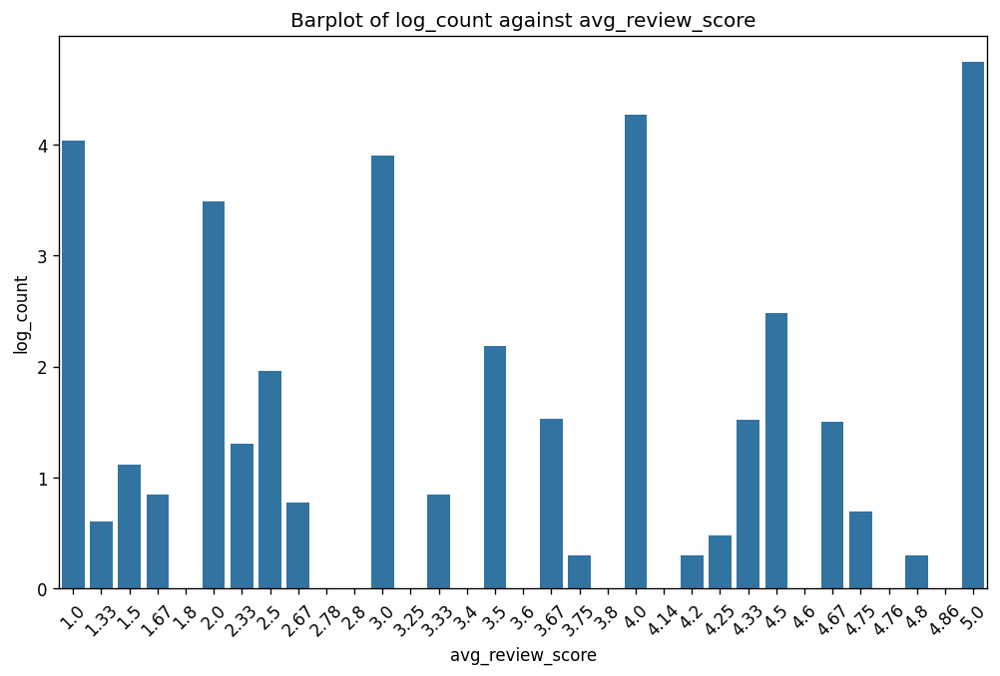

In [93]:
plt.figure(figsize=(10, 6))
sns.barplot(x='avg_review_score', y='log_count', data=avg_review_score)
plt.title('Barplot of log_count against avg_review_score')
plt.xticks(rotation=45)
plt.xlabel('avg_review_score')
plt.ylabel('log_count')
plt.show()


In [94]:
customer_review_agg.rating_rate.value_counts().sort_index()

rating_rate
0.000000      716
0.333333        2
0.500000       35
0.666667        3
0.750000        1
1.000000    95339
Name: count, dtype: int64

In [95]:
customer_review_agg.comment_rate.value_counts().sort_index()

comment_rate
0.000000    54646
0.142857        1
0.166667        2
0.200000        1
0.250000       11
0.333333       48
0.400000        3
0.500000      584
0.600000        2
0.666667       46
0.750000        6
0.800000        1
0.833333        2
1.000000    40743
Name: count, dtype: int64

#### Summary

Most of the customers scored their order, and only a small proportion of customers only scored some of their orders.  

For commenting, the proportion of customers who never wrote review comments is almost equal to the proportion of customers who always wrote review comments , and a small proportion of customers only wrote review comments for some of their orders.  

It's understandable that people are generally much more willing to merely score an order compared to writing a comment, simply because the former one requires much less effort.  
However, the rating rate and comment rate of a customer can be pontential factors correlated with customer's loyalty, purchasing power and LTV. 

### V.1.3. Customer Payment Method Features

In [96]:
customer_pay.head()

,customer_unique_id,most_frequent_payment_types,n_payment_types,average_order_value,average_payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,credit_card,1,141.90,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,credit_card,1,27.19,27.19
2,0000f46a3911fa3c0805444483337064,credit_card,1,86.22,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,credit_card,1,43.62,43.62
4,0004aac84e0df4da2b147fca70cf8255,credit_card,1,196.89,196.89


In [97]:
customer_pay.most_frequent_payment_types.value_counts(normalize=True)

most_frequent_payment_types
credit_card    0.757216
boleto         0.199382
voucher        0.027884
debit_card     0.015486
not_defined    0.000031
Name: proportion, dtype: float64

In [98]:
customer_pay.n_payment_types.value_counts(normalize=True).sort_index()

n_payment_types
1    0.973567
2    0.026245
3    0.000188
Name: proportion, dtype: float64

In [99]:
customer_pay[customer_pay.n_payment_types==1].most_frequent_payment_types.value_counts(normalize=True)

most_frequent_payment_types
credit_card    0.765352
boleto         0.203359
debit_card     0.015671
voucher        0.015596
not_defined    0.000021
Name: proportion, dtype: float64

#### Summary

More than 75% customers used credit card as their most frequent payment method, followed by boleto accounting for 20%, which is a type of financial document that represents a cash-based invoice in Brazil. Notice that only a small proportion of customer used debit card as their first choice.  
  
Credit card V.S. debit card: Credit card is much more popular in Brazil than debit card, and the following reasons may serve as explanation:  
* Credit cards provide access to credit and the ability to make purchases even when consumers do not have immediate funds. This is particularly appealing in Brazil, where credit cards often offer the option to pay in installments without interest. This feature makes larger purchases more manageable for consumers and is a significant advantage over debit cards, which deduct funds directly from one's bank account.
* Rewards and Benefits: Credit cards in Brazil frequently come with rewards programs, offering points, cashback, or miles that can be redeemed for various goods and services. These incentives encourage the use of credit cards over debit cards, which typically do not offer comparable rewards.
* Security Concerns: Credit cards generally offer better fraud protection than debit cards. In the case of fraudulent transactions, credit card users are often able to dispute charges without having immediate funds withdrawn from their bank account, as would be the case with a debit card.
  
More about boleto: Although Brazil has made significant strides in financial inclusion, a segment of the population remains unbanked or underbanked, with limited access to banking services, including credit cards and debit cards. Boleto bancário serves as an inclusive payment option for these consumers, allowing them to participate in e-commerce even without bank account.

Customers behavior in payment method choice may influence customer's LTV in following aspects:  
1. Impact of Most Frequently Used Payment Method  
* Payment Flexibility and Convenience: Customers who use credit cards most frequently may perceive a higher level of payment flexibility and convenience, potentially leading to higher transaction values and more frequent purchases. Also, Credit cards often offer benefits such as reward points and cashback, which can incentivize customers to spend more, positively impacting their LTV.  
* Loyalty: A customer’s trust in their preferred payment method can lead to increased satisfaction and loyalty, thereby enhancing LTV.  
* Payment Method Accessibility: In regions like Brazil, where a significant portion of the population may be unbanked or have limited access to traditional banking services, alternative payment methods like boleto bancário are popular. Customers using such inclusive payment options might exhibit different shopping behaviors compared to those using bank-related payment methods, potentially affecting their LTV.  
  
2. Impact of Number of Different Payment Methods Used  
* Flexibility in Payment Method: Customers who use multiple payment methods might be more engaged and have a higher potential LTV. This behavior can indicate that they are more committed to finding ways to make purchases from the platform, suggesting a higher level of loyalty and engagement.  
* Risk Diversification: Customers who use multiple payment methods might be less impacted by issues with a single payment method (e.g., credit card fraud or expiration). This can lead to more consistent purchasing behavior over time, positively affecting LTV.  

### V.1.4. Customer Average Payment Value 
* Average Payment Value (APV): total payment amount / total items bought  
* Average Order Value (AOV): total payment amount / total orders placed  

The above two features are different concepts. APV helps us understand how much customers are willing to pay for individual products or services, where a higher APV suggests the customer's preference and purchasing power of higher-value products. AOV, on the other hand, indicates how much a customer are preferred to order at a time, where a higher AOV suggests that the customer is purchasing more items in a single transaction or opting for higher-valued items.

In [100]:
customer_pay.head()

,customer_unique_id,most_frequent_payment_types,n_payment_types,average_order_value,average_payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,credit_card,1,141.90,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,credit_card,1,27.19,27.19
2,0000f46a3911fa3c0805444483337064,credit_card,1,86.22,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,credit_card,1,43.62,43.62
4,0004aac84e0df4da2b147fca70cf8255,credit_card,1,196.89,196.89


In [101]:
customer_pay[['average_payment_value', 'average_order_value']].describe()

,average_payment_value,average_order_value
count,95826.000000,95826.000000
mean,158.709148,161.402144
std,219.549594,222.370875
min,0.000000,0.000000
25%,60.850000,62.440000
50%,103.790000,105.840000
75%,175.080000,177.160000
max,13664.080000,13664.080000


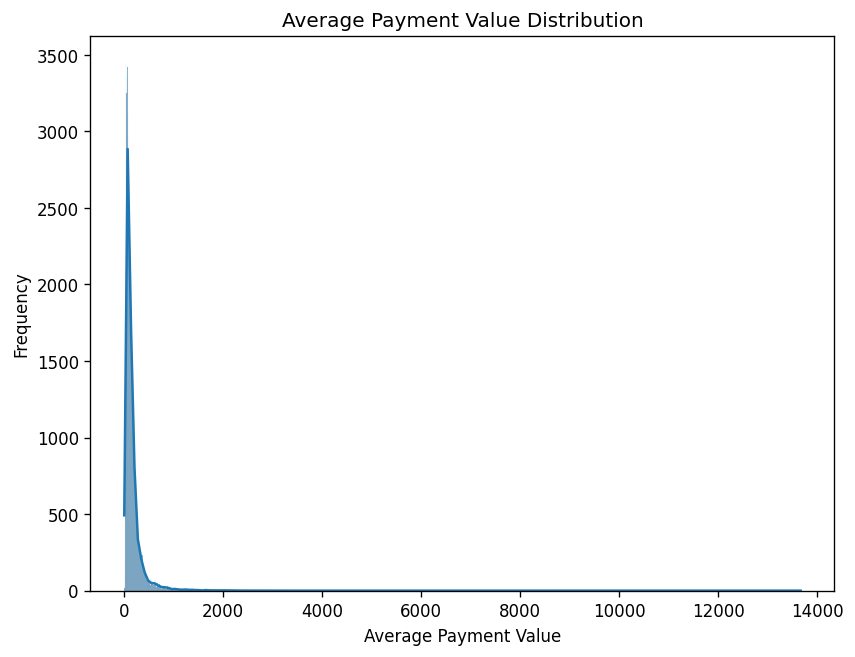

In [102]:
# Histogram of Average Payment Value

plt.figure(figsize=(8, 6))
sns.histplot(customer_pay['average_payment_value'], kde=True)
plt.xlabel('Average Payment Value')
plt.ylabel('Frequency')
plt.title('Average Payment Value Distribution')
plt.show()

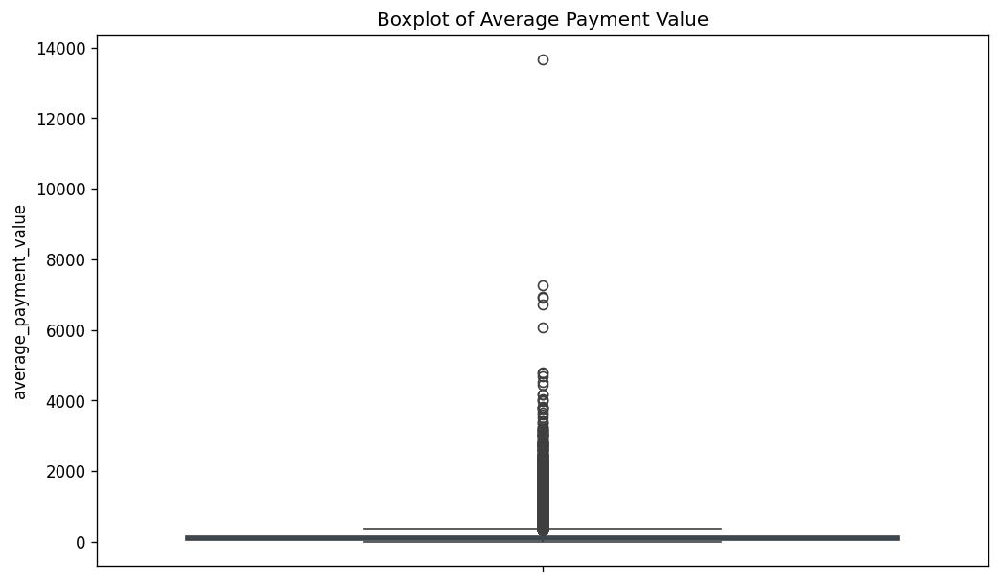

In [103]:
# Check outliers using Boxplot

plt.figure(figsize=(10, 6))
sns.boxplot(customer_pay['average_payment_value'])
plt.title('Boxplot of Average Payment Value')
plt.show()

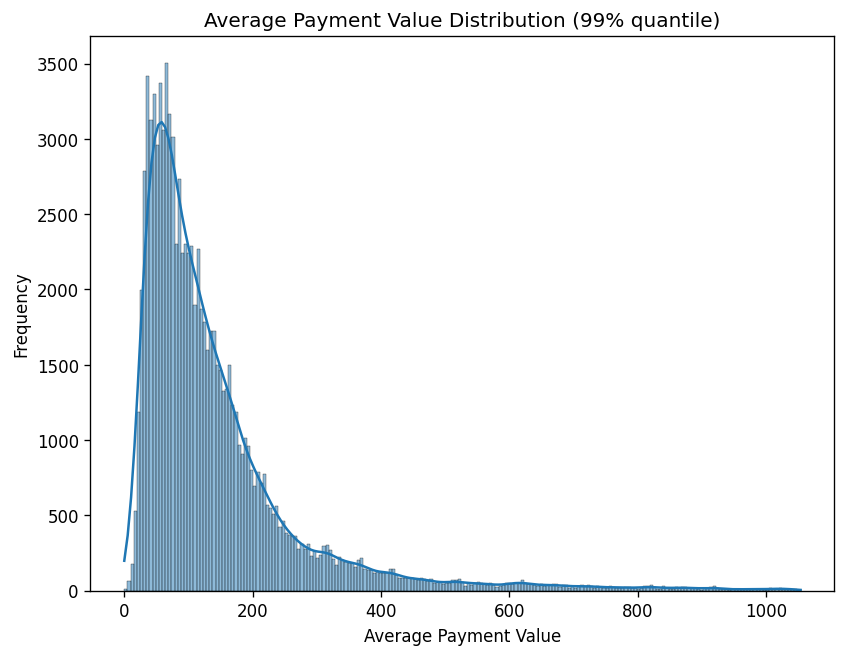

In [104]:
# Histogram of Average Payment Value < 99%

plt.figure(figsize=(8, 6))
sns.histplot(customer_pay[customer_pay.average_payment_value < customer_pay.average_payment_value.quantile(0.99)]['average_payment_value'], kde=True)
plt.xlabel('Average Payment Value')
plt.ylabel('Frequency')
plt.title('Average Payment Value Distribution (99% quantile)')
plt.show()

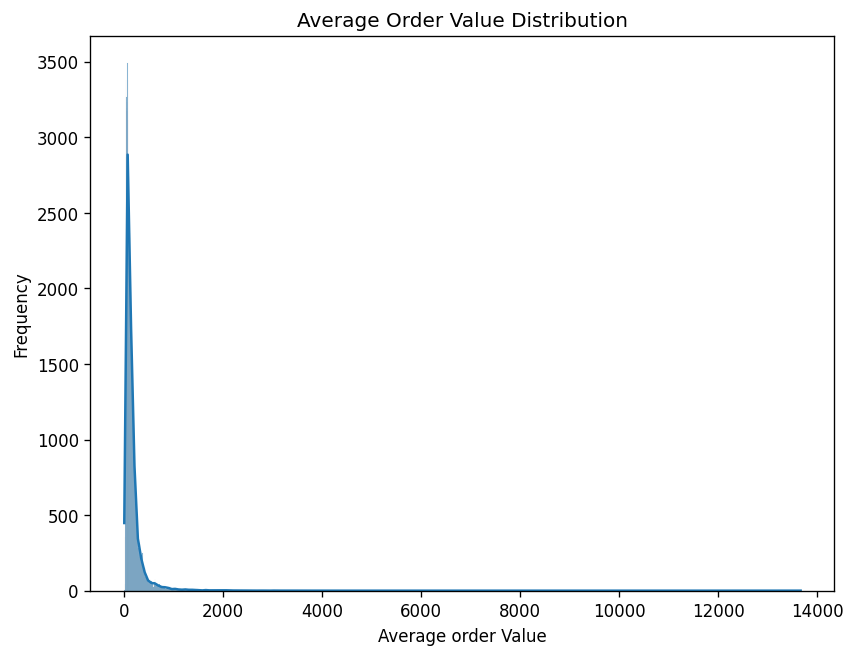

In [105]:
# Histogram of Average Order Value

plt.figure(figsize=(8, 6))
sns.histplot(customer_pay['average_order_value'], kde=True)
plt.xlabel('Average order Value')
plt.ylabel('Frequency')
plt.title('Average Order Value Distribution')
plt.show()

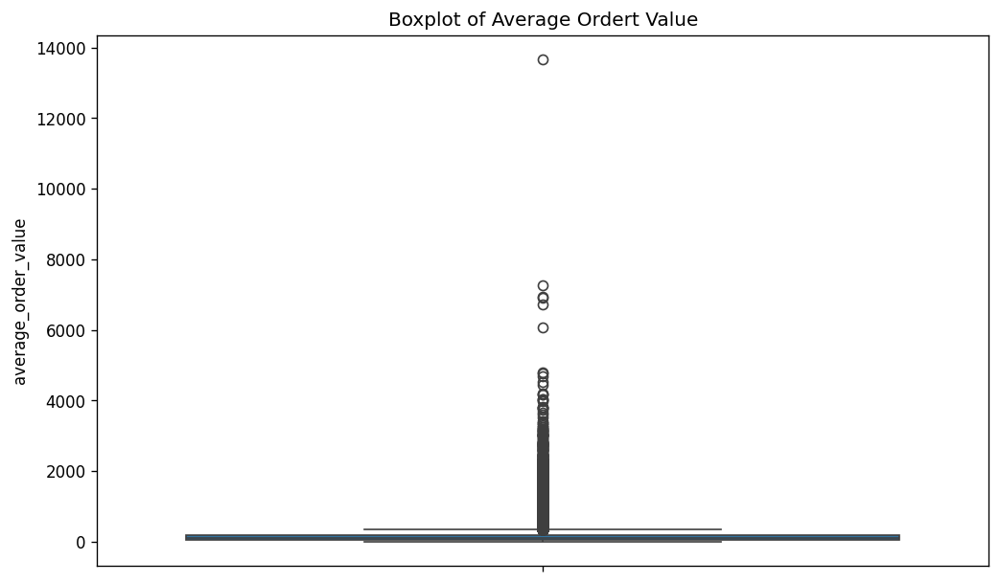

In [106]:
# Check outliers using Boxplot

plt.figure(figsize=(10, 6))
sns.boxplot(customer_pay['average_order_value'])
plt.title('Boxplot of Average Ordert Value')
plt.show()

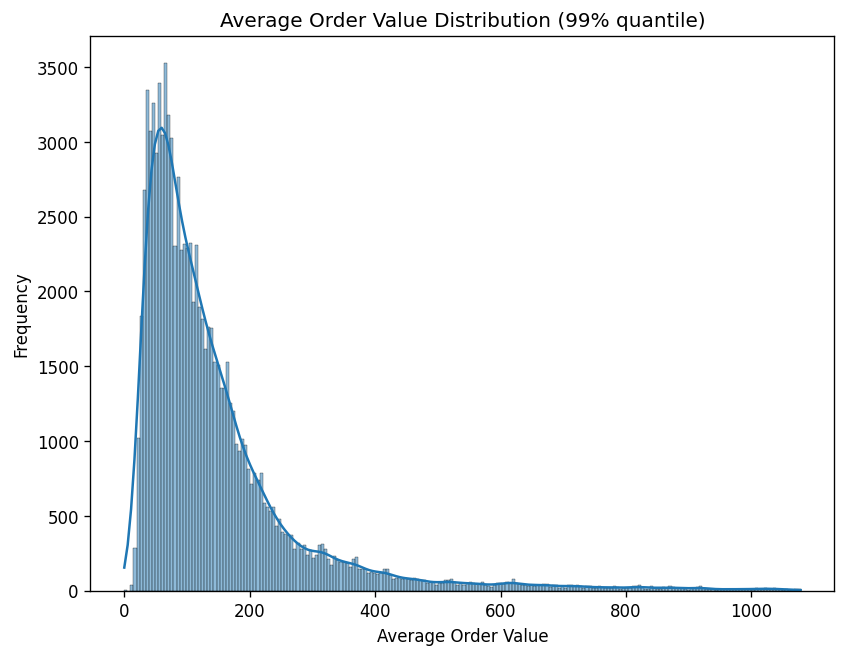

In [107]:
# Histogram of Average Order Value < 99%

plt.figure(figsize=(8, 6))
sns.histplot(customer_pay[customer_pay.average_order_value < customer_pay.average_order_value.quantile(0.99)]['average_order_value'], kde=True)
plt.xlabel('Average Order Value')
plt.ylabel('Frequency')
plt.title('Average Order Value Distribution < 99% quantile')
plt.show()

#### Summary

Overall, we can see that the distribution of average payment value and average order value are both extremely right skewed with many outliers.

### V.1.5.Customer Product Purchase Features

In [108]:
customer_product_agg.head()

,customer_unique_id,most_frequent_product_category,product_category_group
0,0000366f3b9a7992bf8c76cfdf3221e2,bed_bath_table,Home & Living
1,0000b849f77a49e4a4ce2b2a4ca5be3f,health_beauty,Beauty & Fashion
2,0000f46a3911fa3c0805444483337064,stationery,Tools
3,0000f6ccb0745a6a4b88665a16c9f078,telephony,Electronics
4,0004aac84e0df4da2b147fca70cf8255,telephony,Electronics


In [109]:
customer_product_agg.most_frequent_product_category.value_counts()

most_frequent_product_category
bed_bath_table               8901
health_beauty                8542
sports_leisure               7373
computers_accessories        6449
furniture_decor              6081
                             ... 
arts_and_craftmanship          19
cds_dvds_musicals              12
la_cuisine                     10
fashion_childrens_clothes       7
security_and_services           2
Name: count, Length: 71, dtype: int64

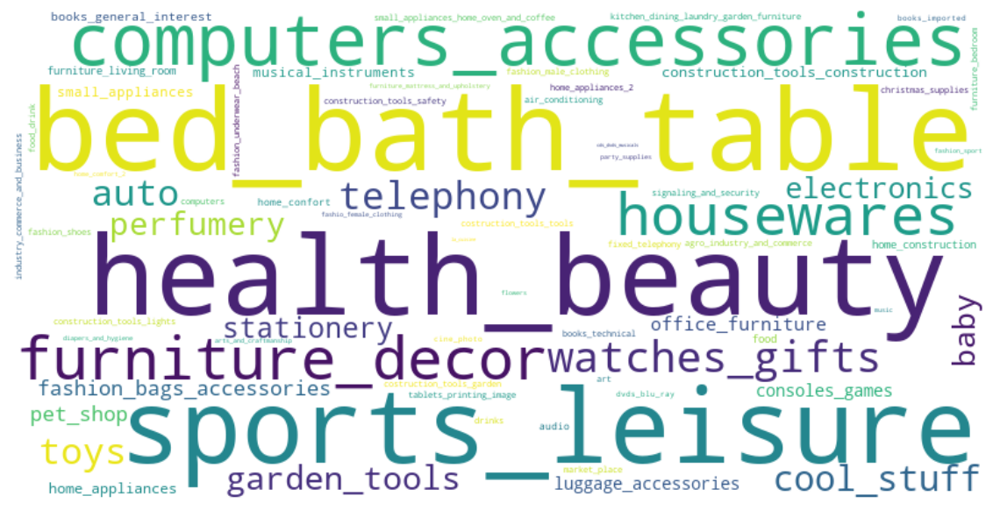

In [110]:
# generste wordcloud for most frequently bought product categories

category_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(Counter(customer_product_agg.most_frequent_product_category.dropna()))
plt.figure(figsize=(12, 8))
plt.imshow(category_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

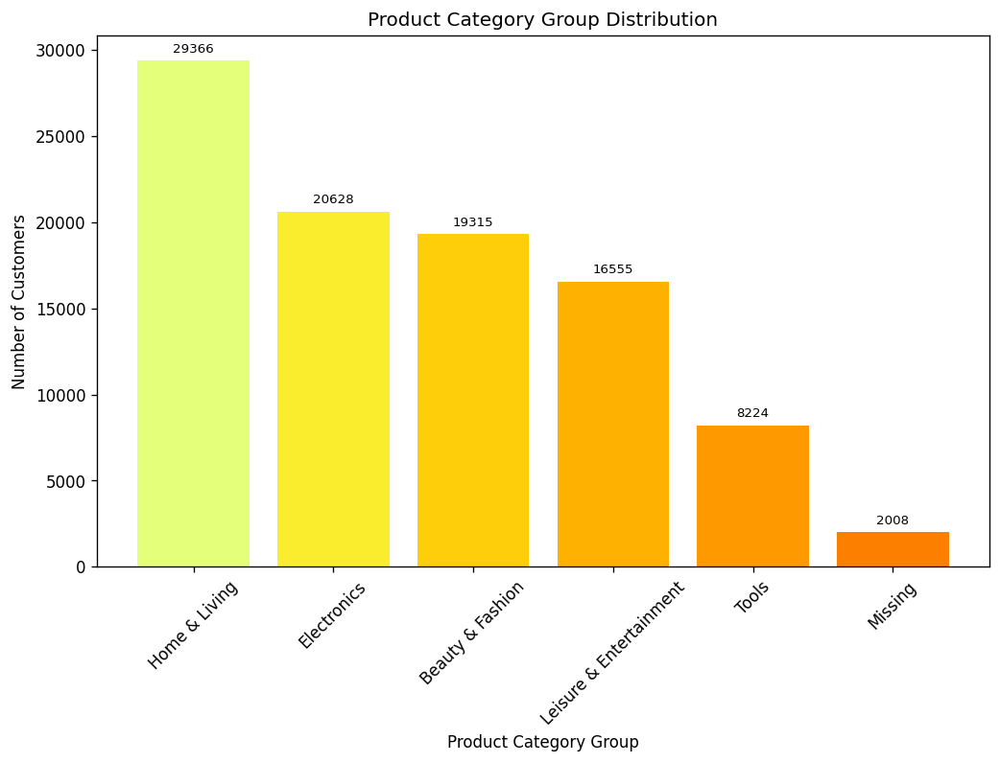

In [111]:
# generate bar plot for most frequently bought product category groups

colors = plt.cm.Wistia(np.linspace(0, 1, len(customer_product_agg.product_category_group.value_counts())))

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["figure.dpi"] = 120

bars = plt.bar(customer_product_agg.product_category_group.value_counts().index, customer_product_agg.product_category_group.value_counts().values, color=colors)

for bar, value in zip(bars, customer_product_agg.product_category_group.value_counts().values):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 300, f"{value}", ha='center', va='bottom', fontsize=8)

plt.ylabel('Number of Customers')
plt.xlabel('Product Category Group')
plt.xticks(rotation=45)
plt.title('Product Category Group Distribution')

plt.show()

#### Summary

We can see that most of the customers bought the Home & Living Category products the most frequently

## V.2. Inferential Statistics

In this part, we analyzed the customer purchase preference based on 2 time factors:  
* Time of Day Purchase Preference: to find out how customers' purchase preferences differ by time of day -- Dawn, Morning, Afternoon, Nigh  
* Day of Week Purchase Preference: to find out how customers' purchase preferences differ by day of week -- Monday - Sunday  
  
In order to analyze the influence of time factor, which is categorical, on the number of orders a customer placed, we tried ANOVA first, checked the assumptions of ANOVA, and decided on whether to take the AVOVA result or to use other statistical methods

### V.2.1. Time of Day ~ Number of Orders

#### Tried ANOVA first
Null Hypothesis (H0): The population means of all 4 levels are equal. This means there is no statistically significant difference across the different levels.  
Alternative Hypothesis (Ha): At least one level's population means is different from the others. This suggests that there is a statistically significant difference in at least one level when compared to the others.  

In [50]:
# create pivot table for customer orders by time of day
order_daybytime = customer_rfm.pivot_table(
    index='customer_unique_id', 
    columns='order_purchase_time_day', 
    values='order_id', 
    aggfunc='nunique').reset_index()

In [6]:
order_daybytime.fillna(0, inplace=True)
order_daybytime.head()

order_purchase_time_day,customer_unique_id,Afternoon,Dawn,Morning,Night
0,0000366f3b9a7992bf8c76cfdf3221e2,0.0,0.0,1.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,0.0,1.0,0.0
2,0000f46a3911fa3c0805444483337064,0.0,0.0,0.0,1.0
3,0000f6ccb0745a6a4b88665a16c9f078,0.0,0.0,0.0,1.0
4,0004aac84e0df4da2b147fca70cf8255,0.0,0.0,0.0,1.0


<Axes: >

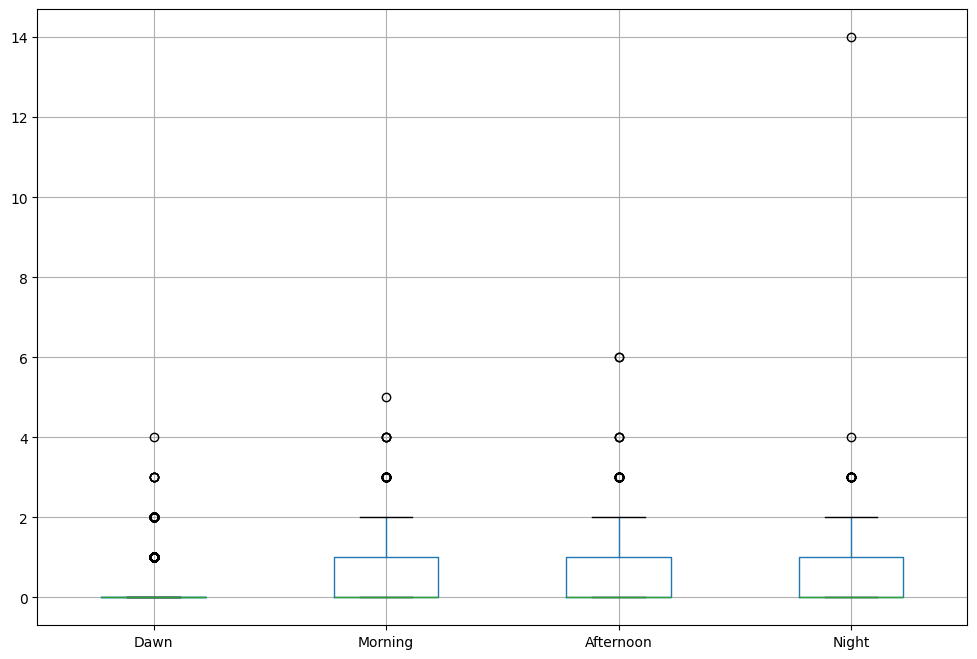

In [7]:
order_daybytime.boxplot(column=['Dawn', 'Morning', 'Afternoon', 'Night'], figsize=(12, 8))

#### check assumptions for ANOVA:
* normality
* homoscedasticity

Shapiro-Wilk test can be used to test the normality of data, but it can be too sensitive for large samples, which means it might be too strict for our data. Therefore, we choose to use QQ-plot to get a general initial insight of normality

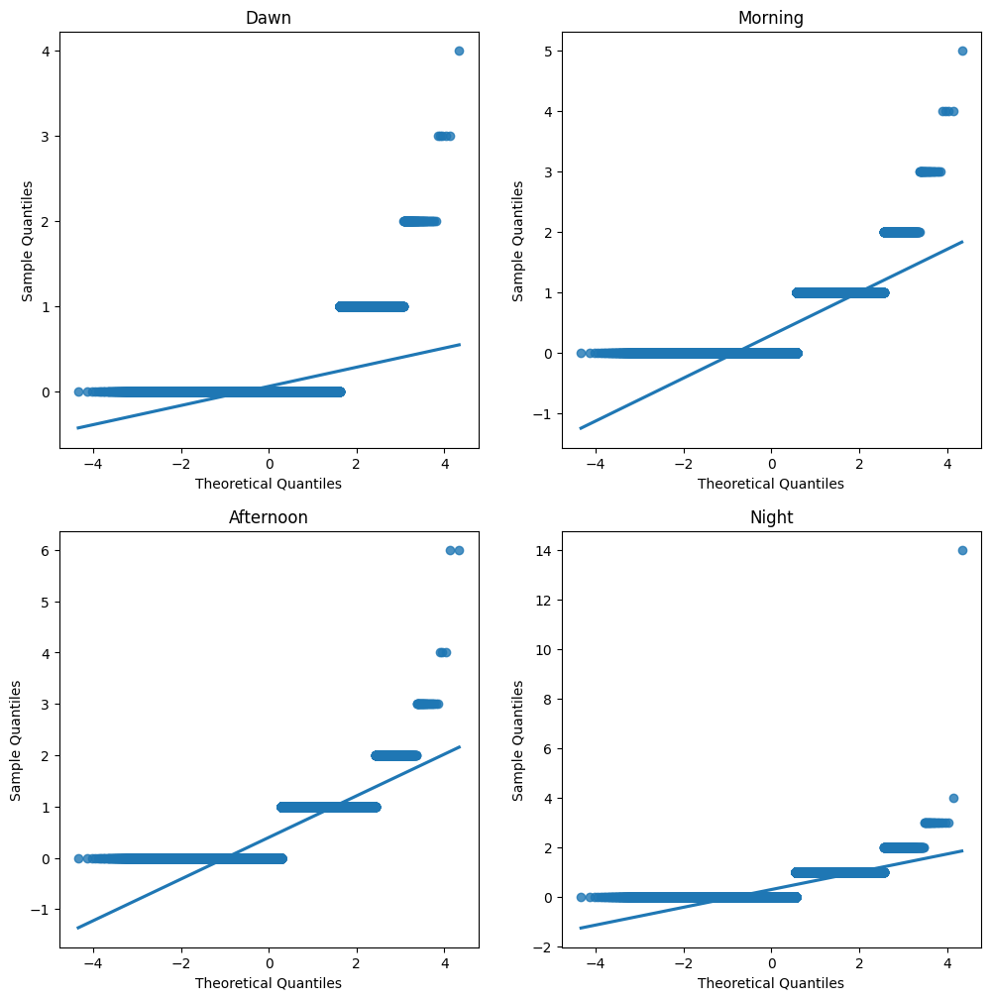

In [72]:
# use QQ plot to check the normality
from scipy import stats
column=['Dawn', 'Morning', 'Afternoon', 'Night']
plt.figure(figsize=(12, 12))

for i in range(4):
    testdata = order_daybytime[column[i]]
    qntls, xr = stats.probplot(testdata, fit=False)
    plt.subplot(2, 2, i+1)
    sns.regplot(y=xr, x=qntls)
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title(column[i])

plt.show()

#### Kruskal-Wallis H test

The QQ-plot indicates that the number of orders for each of the 4 levels of time period are all not normally distributed. That is particularly because of data sparsity: most of the customers (97%) only purchased once on Olist platform, resulting in many 0's in order_daybytime.  
Therefore, we turned to non-parametric testing methods  instead of ANOVA:  

The Kruskal-Wallis H test is a non-parametric method that does not assume that the data comes from a specific distribution, and does not require the numerical value of the data to be normally distributed or homoscedasticity, since it assesses the difference between levels based on the median of data.  
  
The Kruskal-Wallis H test only requires two assumptions: data of different level are independent, and data is ordinal.  
  
Null Hypothesis (H0): The population medians of all 4 levels are equal. This means there is no statistically significant difference across the different levels.  
Alternative Hypothesis (Ha): At least one level's population median is different from the others. This suggests that there is a statistically significant difference in at least one level when compared to the others.  

We utilized the kruskal method from scipy.stats to conduct Kruskal-Wallis H test, where we used significance level = 0.05 to compare with the p-value.  

In [73]:
# use kruskal-wallis test to compare the 4 segments
from scipy.stats import kruskal
stat1, p1 = kruskal(order_daybytime['Dawn'], order_daybytime['Morning'], order_daybytime['Afternoon'], order_daybytime['Night'])
print('Kruskal-Wallis H test statistic:', stat1)
print('P-value:', p1)

Kruskal-Wallis H test statistic: 30609.89419331755
P-value: 0.0


Since p << 0.05, there is a statistically significant difference between the four levels, which means customer's purchase preference based on time of day is significant.



### V.2.2. Day of Week ~ Number of Orders

In [74]:
customer_rfm.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,id,sigla,nome,nome_regiao,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,order_id,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,payment_type,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017,5,May,201705,20170516,16,1,Tue,15,Afternoon,credit_card,146.87
1,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,95261f608a64bbbe760a212b4d48a4ee,2018-06-15 20:07:13,2018,6,Jun,201806,20180615,15,4,Fri,20,Night,credit_card,94.77
2,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,9444fa2ab50a3f5af63b48be297eda24,2017-09-09 15:40:00,2017,9,Sep,201709,20170909,9,5,Sat,15,Afternoon,credit_card,62.50
3,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,dceb8e88274c6f42a88a76ed979eb817,2018-03-26 12:04:55,2018,3,Mar,201803,20180326,26,0,Mon,12,Morning,credit_card,32.69
4,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,6ee1cea1b2edcc713f83ebfbccbc57f9,2018-07-29 20:39:20,2018,7,Jul,201807,20180729,29,6,Sun,20,Night,credit_card,77.01


In [75]:
# create pivot table for customer orders by day of week
order_weekbyday = customer_rfm.pivot_table(
    index='customer_unique_id', 
    columns='order_purchase_dayofweek_name', 
    values='order_id', 
    aggfunc='nunique',
    fill_value=0).reset_index()

order_weekbyday.head()

order_purchase_dayofweek_name,customer_unique_id,Fri,Mon,Sat,Sun,Thu,Tue,Wed
0,0000366f3b9a7992bf8c76cfdf3221e2,0,0,0,0,1,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0,1,0,0,0,0,0
2,0000f46a3911fa3c0805444483337064,1,0,0,0,0,0,0
3,0000f6ccb0745a6a4b88665a16c9f078,0,0,0,0,1,0,0
4,0004aac84e0df4da2b147fca70cf8255,0,0,0,0,0,1,0


<Axes: >

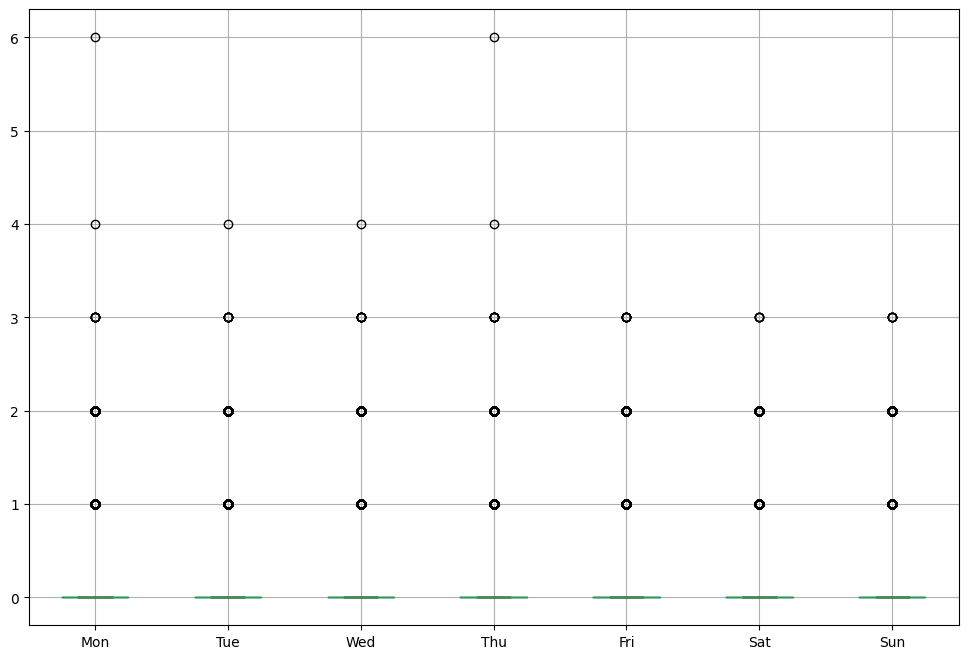

In [76]:
order_weekbyday.boxplot(column=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], figsize=(12, 8))

#### check assumptions for ANOVA

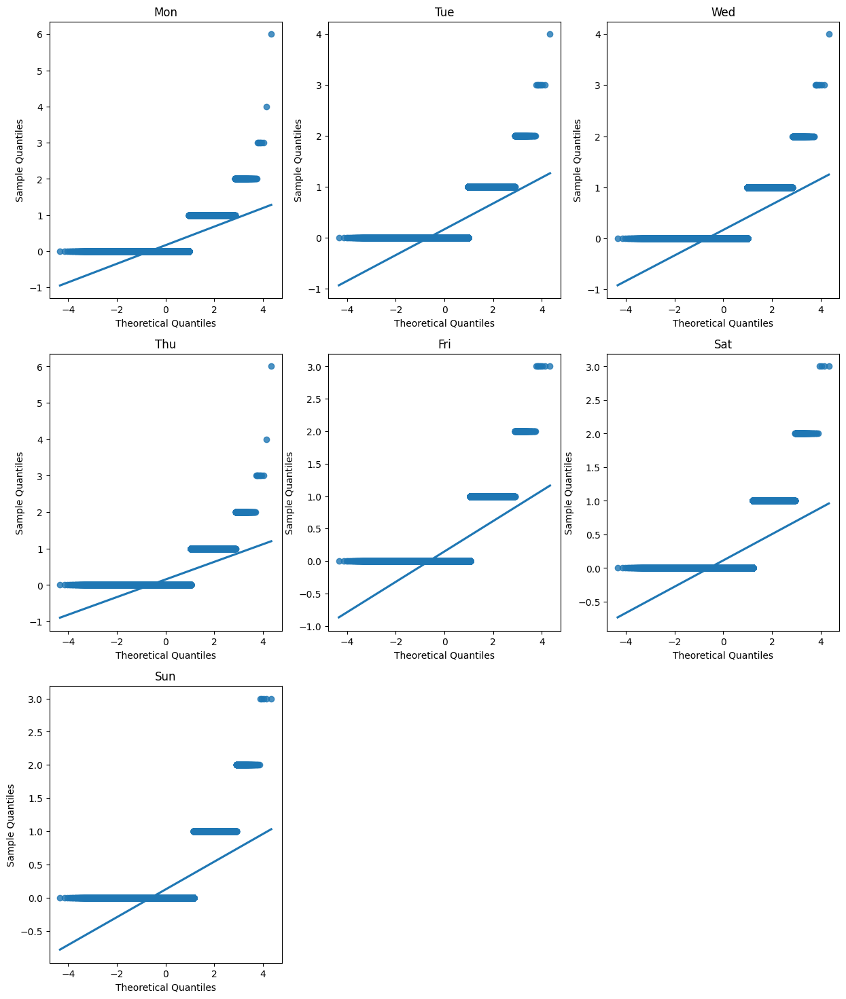

In [79]:
column=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
plt.figure(figsize=(15, 18))

for i in range(7):
    testdata = order_weekbyday[column[i]]
    qntls, xr = stats.probplot(testdata, fit=False)
    plt.subplot(3, 3, i+1)
    sns.regplot(y=xr, x=qntls)
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title(column[i])

plt.show()

#### Kruskal-Wallis H test

The QQ-plot indicates that the number of orders for each of the 7 days are all not normally distributed. That is particularly because of data sparsity: most of the customers (97%) only purchased once on Olist platform, resulting in many 0's in order_daybytime.  
Therefore, we turned to Kruskal-Wallis H test instead of ANOVA:  
  
Null Hypothesis (H0): The population medians of all 7 levels are equal. This means there is no statistically significant difference across the different levels.  
Alternative Hypothesis (Ha): At least one level's population median is different from the others. This suggests that there is a statistically significant difference in at least one level when compared to the others.  
  
We utilized the kruskal method from scipy.stats to conduct Kruskal-Wallis H test, where we used significance level = 0.05 to compare with the p-value.  

In [80]:
stat2, p2 = kruskal(order_weekbyday['Mon'], order_weekbyday['Tue'], order_weekbyday['Wed'], order_weekbyday['Thu'], order_weekbyday['Fri'], order_weekbyday['Sat'], order_weekbyday['Sun'])
print('Kruskal-Wallis H test statistic:', stat2)
print('P-value:', p2)

Kruskal-Wallis H test statistic: 2052.3768514137164
P-value: 0.0


Since p << 0.05, there is a statistically significant difference between the seven levels, which means customer's purchase preference based on day of week is significant.

### V.2.3. Time of Day ～ Day of Week 


We intend to test their correlation of this two categorical variables using chi-squared test:  
Null Hypothesis: the two variables are independent;  
Alternative Hypothesis: the two variables are correlated  
We chose 0.05 as the significance level

In [81]:
customer_rfm.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,id,sigla,nome,nome_regiao,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,order_id,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,payment_type,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017,5,May,201705,20170516,16,1,Tue,15,Afternoon,credit_card,146.87
1,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,95261f608a64bbbe760a212b4d48a4ee,2018-06-15 20:07:13,2018,6,Jun,201806,20180615,15,4,Fri,20,Night,credit_card,94.77
2,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,9444fa2ab50a3f5af63b48be297eda24,2017-09-09 15:40:00,2017,9,Sep,201709,20170909,9,5,Sat,15,Afternoon,credit_card,62.50
3,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,dceb8e88274c6f42a88a76ed979eb817,2018-03-26 12:04:55,2018,3,Mar,201803,20180326,26,0,Mon,12,Morning,credit_card,32.69
4,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,6ee1cea1b2edcc713f83ebfbccbc57f9,2018-07-29 20:39:20,2018,7,Jul,201807,20180729,29,6,Sun,20,Night,credit_card,77.01


In [82]:
customer_rfm_unique_orderid = customer_rfm.drop_duplicates('customer_id', keep='first')

In [84]:
order_dayofweem_timeofday = pd.crosstab(customer_rfm_unique_orderid.order_purchase_dayofweek_name, customer_rfm_unique_orderid.order_purchase_time_day)
new_order = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
order_dayofweem_timeofday = order_dayofweem_timeofday.reindex(new_order)
order_dayofweem_timeofday

order_purchase_time_day,Dawn,Morning,Afternoon,Night
order_purchase_dayofweek_name,,,,
Mon,670,4496,6195,4789
Tue,695,4518,6123,4585
Wed,840,4560,5901,4198
Thu,779,4391,5654,3901
Fri,932,4258,5438,3450
Sat,702,2845,4205,3107
Sun,607,2578,4519,4225


In [86]:
from scipy.stats import chi2_contingency

chi2, p, dof, expected = chi2_contingency(order_dayofweem_timeofday)

chi2, p, dof

(705.4001005860357, 4.054834630523967e-138, 18)

The P-value << 0.05, which rejects the null hypothesis and concludes that there is a significant correlation between the four time periods of the day and  the seven days of the week in terms of customer purchase preference

#### Visulization of the four time periods of the day and the seven days of the week in terms of customer purchase preference

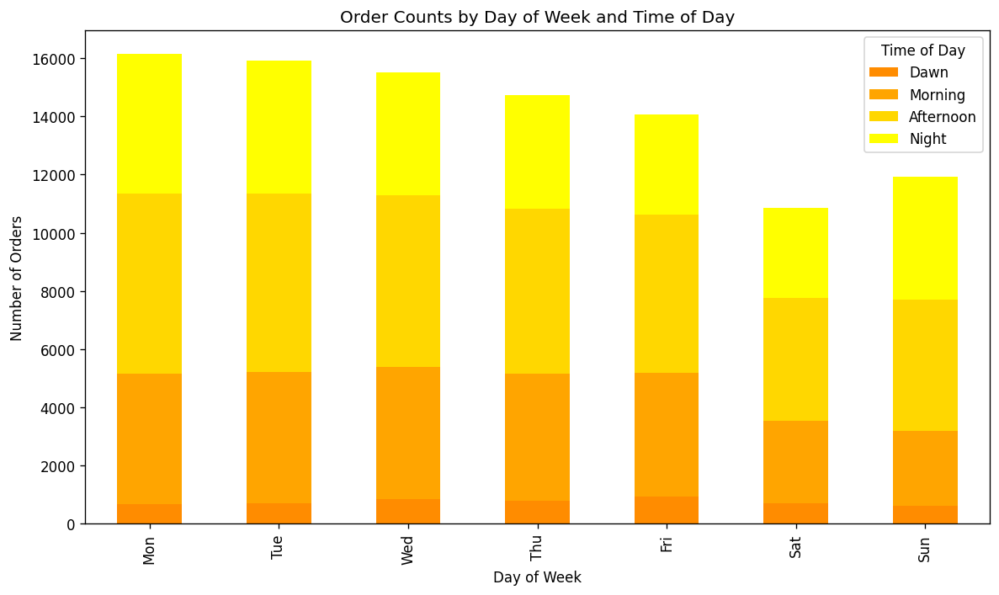

In [90]:
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["figure.dpi"] = 120

order_dayofweem_timeofday.plot(kind='bar', stacked=True, color=colors)
plt.xlabel('Day of Week')
plt.ylabel('Number of Orders')
plt.legend(title='Time of Day')
plt.title('Order Counts by Day of Week and Time of Day')

plt.tight_layout()
plt.show()

In [105]:
customer_rfm_unique_orderid['order_purchase_dayofweek_name'] = pd.Categorical(customer_rfm_unique_orderid['order_purchase_dayofweek_name'], 
                                                                              categories=new_order, ordered=True)

customer_rfm_unique_orderid['order_purchase_time_day'] = pd.Categorical(customer_rfm_unique_orderid['order_purchase_time_day'], 
                                                                              categories=['Dawn', 'Morning', 'Afternoon', 'Night'], ordered=True)

customer_rfm_unique_orderid.sort_values('order_purchase_dayofweek_name', ascending=False, inplace=True)
customer_rfm_unique_orderid.sort_values('order_purchase_time_day',ascending=False, inplace=True)



<Figure size 1920x2400 with 0 Axes>

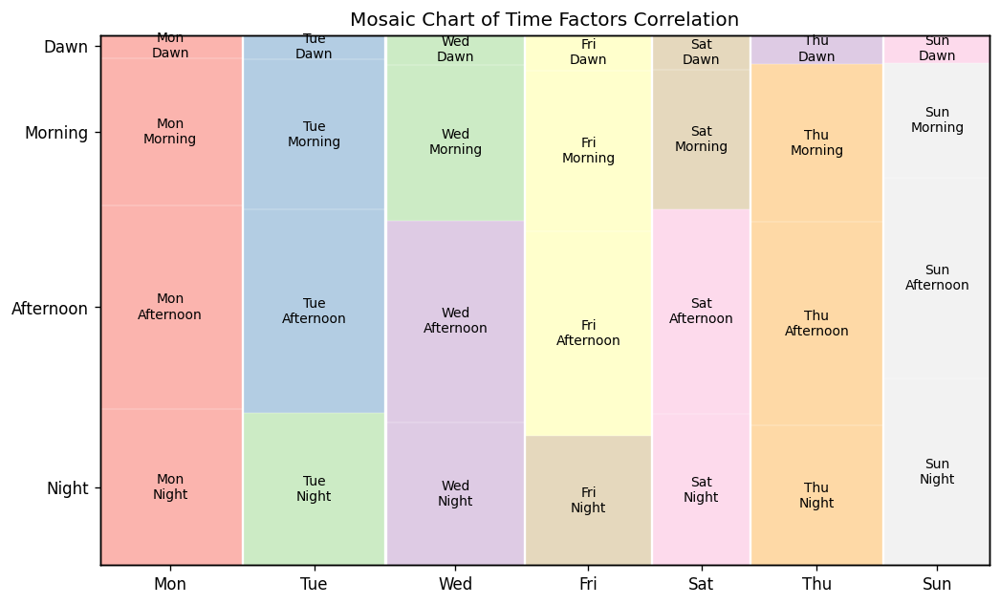

In [106]:
from statsmodels.graphics.mosaicplot import mosaic

colormap = plt.cm.Pastel1
color_count = 7*4
colors = [colormap(i / color_count) for i in range(color_count)]  

category_tuples = [('Mon', 'Dawn'), ('Mon', 'Morning'), ('Mon', 'Afternoon'), ('Mon', 'Night'), 
                   ('Tue', 'Dawn'), ('Tue', 'Morning'), ('Tue', 'Afternoon'), ('Tue', 'Night'), 
                   ('Wed', 'Dawn'), ('Wed', 'Morning'), ('Wed', 'Afternoon'), ('Wed', 'Night'), 
                   ('Thu', 'Dawn'), ('Thu', 'Morning'), ('Thu', 'Afternoon'), ('Thu', 'Night'), 
                   ('Fri', 'Dawn'), ('Fri', 'Morning'), ('Fri', 'Afternoon'), ('Fri', 'Night'), 
                   ('Sat', 'Dawn'), ('Sat', 'Morning'), ('Sat', 'Afternoon'), ('Sat', 'Night'), 
                   ('Sun', 'Dawn'), ('Sun', 'Morning'), ('Sun', 'Afternoon'), ('Sun', 'Night')]
color_dict = dict(zip(category_tuples, colors))

plt.figure(figsize=(16,20))
mt = mosaic(customer_rfm_unique_orderid, ['order_purchase_dayofweek_name', 'order_purchase_time_day'], 
            title='Mosaic Chart of Time Factors Correlation',
            properties=lambda key: {'color': color_dict[key] if key in color_dict else 'white'})

### Conclusion:

In this section, we examined the customer’s purchase preference based on time of day and day of week, and tested the correlation of these two time-factors. Results show that both of the time of day and day of week are significant on customer’s purchase preference, and there is a correlation between time of day and day of week in terms of customer purchase preference.  

Specifically, customers generally prefer to purchase in the afternoons and mornings compared with dawns, prefer to purchase on weekdays (especially on Mondays and Tuesdays) compared with weekends. Some actionable insights:  
* Websites availability: Traffic is the lowest on dawns, indicating that Olist can schedule maintenance on dawns to avoid peak times. Also, Olist should put more efforts on optimizing the latency of websites and transaction reliability during afternoons and weekdays, and also could schedule more customer support staff to handle inquiries and issues more promptly.  
* Also, Olist can launch marketing campaigns during peak purchase times. For example, notifications via email and apps can be timed at afternoons on Mondays and Tuesdays to maximize impact and conversion rates.  
* Uncover weekend potentials: Since the weekend sales volume is pretty low compared with weekdays, Olist should develop weekend-specific strategies to improve weekend engagement and fully exploit the potential of weenkends, such as weekend-only deals or previews of upcoming week's promotions.


## V.3. Comparative Analysis

We compared different subsets of our customer-wise data based on two segmentation criteria:  
* Geolocation (State);  
* Payment Method Preference (Most frequent payment type)  

We compared the difference on customer’s RFM among segments


### V.3.1. Geolocation ~ customer RFM

In [3]:
customer_agg.head()

,customer_unique_id,avg_review_score,order_counts,review_score_counts,review_comment_counts,rating_rate,comment_rate,most_frequent_payment_types,n_payment_types,average_payment_value,average_order_value,most_frequent_product_category,product_category_group,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,1,1,1,1.0,1.0,credit_card,1,141.90,141.90,bed_bath_table,Home & Living,2018-05-10 10:56:27,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,1,1,0,1.0,0.0,credit_card,1,27.19,27.19,health_beauty,Beauty & Fashion,2018-05-07 11:11:27,163,1,27.19
2,0000f46a3911fa3c0805444483337064,3.0,1,1,0,1.0,0.0,credit_card,1,86.22,86.22,stationery,Tools,2017-03-10 21:05:03,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,1,1,1,1.0,1.0,credit_card,1,43.62,43.62,telephony,Electronics,2017-10-12 20:29:41,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,5.0,1,1,0,1.0,0.0,credit_card,1,196.89,196.89,telephony,Electronics,2017-11-14 19:45:42,336,1,196.89


In [7]:
customer_rmf_geo = pd.merge(customer_agg, customer_rfm, on='customer_unique_id')[['customer_state', 'Recency', 'Frequency', 'Monetary']]
customer_rmf_geo.customer_state.value_counts(normalize=True).head(3)

customer_state
SP    0.420915
RJ    0.130447
MG    0.116711
Name: proportion, dtype: float64

Since there are too many states, we will just analyze top 3 states, which contains 67% of the data

In [10]:
customer_rmf_geo3 = customer_rmf_geo.query('customer_state in ["SP", "RJ", "MG"]')
customer_rmf_geo3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 69211 entries, 0 to 103592
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   customer_state  69211 non-null  object 
 1   Recency         69211 non-null  int64  
 2   Frequency       69211 non-null  int64  
 3   Monetary        69211 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 2.6+ MB


In [11]:
customer_rmf_geo3.describe()

,Recency,Frequency,Monetary
count,69211.000000,69211.000000,69211.000000
mean,284.662467,1.083657,162.783053
std,153.509277,0.421905,223.022693
min,0.000000,1.000000,0.000000
25%,161.000000,1.000000,61.330000
50%,265.000000,1.000000,105.770000
75%,393.000000,1.000000,180.790000
max,764.000000,17.000000,13664.080000


In [12]:
crg = customer_rmf_geo3.pivot_table(index='customer_state', values=['Recency', 'Frequency', 'Monetary'], aggfunc='mean')
crg

,Frequency,Monetary,Recency
customer_state,,,
MG,1.075263,171.212054,293.055082
RJ,1.081989,179.306666,297.582655
SP,1.086502,155.325016,278.331262


In [13]:
crg1 = customer_rmf_geo3[['customer_state', 'Recency']]
crg2 = customer_rmf_geo3[['customer_state', 'Frequency']]
crg3 = customer_rmf_geo3[['customer_state', 'Monetary']]

Text(0.5, 1.0, 'Monetary')

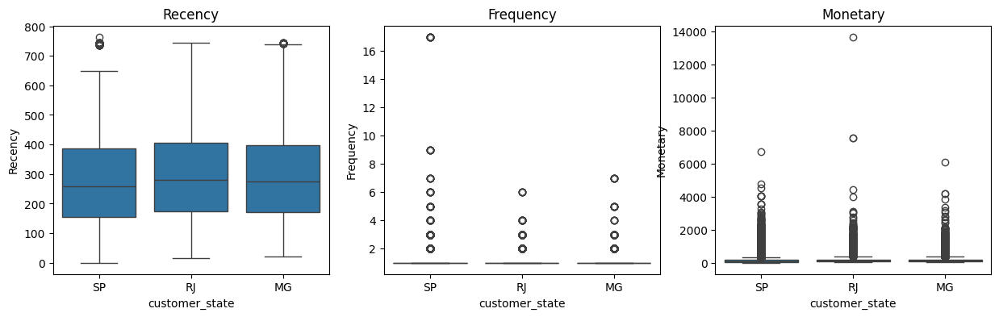

In [14]:
plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
sns.boxplot(x='customer_state', y='Recency', data=customer_rmf_geo3)
plt.title('Recency')

plt.subplot(1, 3, 2)
sns.boxplot(x='customer_state', y='Frequency', data=customer_rmf_geo3)
plt.title('Frequency')

plt.subplot(1, 3, 3)
sns.boxplot(x='customer_state', y='Monetary', data=customer_rmf_geo3)
plt.title('Monetary')

#### Check Assumptions of ANOVA

<Axes: xlabel='Monetary', ylabel='Density'>

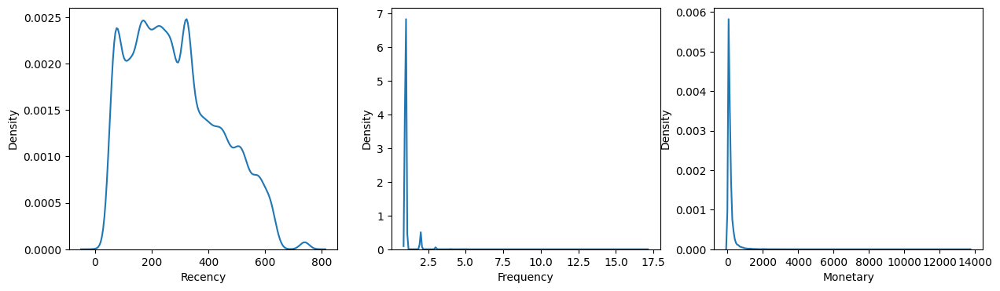

In [16]:
# Draw KDEs for Recency, Frequency, and Monetary

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
sns.kdeplot(data=customer_rmf_geo3, x="Recency")
plt.subplot(1, 3, 2)
sns.kdeplot(data=customer_rmf_geo3, x="Frequency")
plt.subplot(1, 3, 3)
sns.kdeplot(data=customer_rmf_geo3, x="Monetary")

Since the distributions of Recency, Frequency and Monetary are far from Normal, we used box-cox transformation

#### Box-cox Transformation Attempt

In [17]:
from scipy.stats import boxcox

customer_rmf_geo3['Recency_boxcox'], _ = boxcox(customer_rmf_geo3['Recency'] + 0.00001)
customer_rmf_geo3['Frequency_boxcox'], _ = boxcox(customer_rmf_geo3['Frequency'] + 0.00001)
customer_rmf_geo3['Monetary_boxcox'], _ = boxcox(customer_rmf_geo3['Monetary'] + 0.00001)

<Axes: xlabel='Monetary_boxcox', ylabel='Density'>

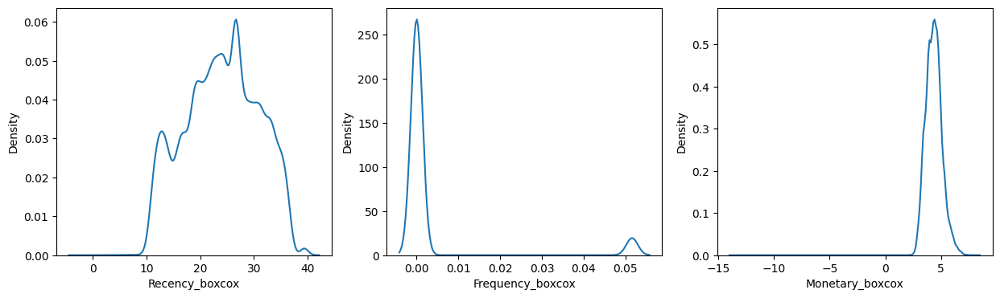

In [18]:
# Draw KDEs for Recency, Frequency, and Monetary

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
sns.kdeplot(data=customer_rmf_geo3, x="Recency_boxcox")
plt.subplot(1, 3, 2)
sns.kdeplot(data=customer_rmf_geo3, x="Frequency_boxcox")
plt.subplot(1, 3, 3)
sns.kdeplot(data=customer_rmf_geo3, x="Monetary_boxcox")

Since the distribution is still far from Normal, we decide to use Kruskal-Wallis H test

#### Kruskal-Wallis H test

Null Hypothesis (H0): The population medians of all 3 geolocational groups  are equal. This means there is no statistically significant difference across the different groups.  
Alternative Hypothesis (Ha): At least one group's population medians is different from the others. This suggests that there is a statistically significant difference in at least one group when compared to the others.  

In [114]:
# use kruskal-wallis test to compare the 3 states for Recency

stat3, p3 = kruskal(crg1.query('customer_state == "SP"').Recency, crg1.query('customer_state == "RJ"').Recency, crg1.query('customer_state == "MG"').Recency)
print('Kruskal-Wallis H test statistic:', stat3)
print('P-value:', p3)

Kruskal-Wallis H test statistic: 221.2113866431041
P-value: 9.216323774850878e-49


In [115]:
# use kruskal-wallis test to compare the 3 states for Frequency

stat4, p4 = kruskal(crg2.query('customer_state == "SP"').Frequency, crg2.query('customer_state == "RJ"').Frequency, crg2.query('customer_state == "MG"').Frequency)
print('Kruskal-Wallis H test statistic:', stat4)
print('P-value:', p4)

Kruskal-Wallis H test statistic: 6.284190051448621
P-value: 0.04319221424761615


In [137]:
# use kruskal-wallis test to compare the 3 states for Monetary

stat5, p5 = kruskal(crg3.query('customer_state == "SP"').Monetary, crg3.query('customer_state == "RJ"').Monetary, crg3.query('customer_state == "MG"').Monetary)
print('Kruskal-Wallis H test statistic:', stat5)
print('P-value:', p5)

Kruskal-Wallis H test statistic: 581.4699755870212
P-value: 5.437497935481702e-127


#### Conclusion
Since p-values are all < 0.05, the difference of customer RFM between three geolocation groups SP, RJ, MG is significant. Also, based on the boxplot, we notice that there are more high-frequency customers in SP, and more high-monetary customers in RJ.  

Olist can design promotions and offers based on the preferences and behaviors of customers in different geolocations. For example, if customers in a specific area tend to make purchases more frequently, exclusive flash sales or limited-time offers can encourage even higher purchase frequency. Also, adjusting the timing and frequency of notifications based on the Recency and Frequency in each geolocation could enhance engagement without overwhelming customers.

### V.3.2. Payment Method ~ customer RFM

In [138]:
customer_agg.head()

,customer_unique_id,avg_review_score,order_counts,review_score_counts,review_comment_counts,rating_rate,comment_rate,most_frequent_payment_types,n_payment_types,average_order_value,average_payment_value,most_frequent_product_category,product_category_group,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,1,1,1,1.0,1.0,credit_card,1,141.90,141.90,bed_bath_table,Home & Living,2018-05-10 10:56:27,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,1,1,0,1.0,0.0,credit_card,1,27.19,27.19,health_beauty,Beauty & Fashion,2018-05-07 11:11:27,163,1,27.19
2,0000f46a3911fa3c0805444483337064,3.0,1,1,0,1.0,0.0,credit_card,1,86.22,86.22,stationery,Tools,2017-03-10 21:05:03,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,1,1,1,1.0,1.0,credit_card,1,43.62,43.62,telephony,Electronics,2017-10-12 20:29:41,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,5.0,1,1,0,1.0,0.0,credit_card,1,196.89,196.89,telephony,Electronics,2017-11-14 19:45:42,336,1,196.89


In [19]:
paymethod_rfm = customer_agg[['most_frequent_payment_types', 'Recency', 'Frequency', 'Monetary']]
paymethod_rfm.most_frequent_payment_types.value_counts()

most_frequent_payment_types
credit_card    72561
boleto         19106
voucher         2672
debit_card      1484
not_defined        3
Name: count, dtype: int64

In [20]:
paymethod_rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95826 entries, 0 to 95825
Data columns (total 4 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   most_frequent_payment_types  95826 non-null  object 
 1   Recency                      95826 non-null  int64  
 2   Frequency                    95826 non-null  int64  
 3   Monetary                     95826 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 2.9+ MB


In [21]:
paymethod_rfm = paymethod_rfm.query('most_frequent_payment_types in ["credit_card", "boleto", "voucher", "debit_card"]')


Text(0.5, 1.0, 'Monetary')

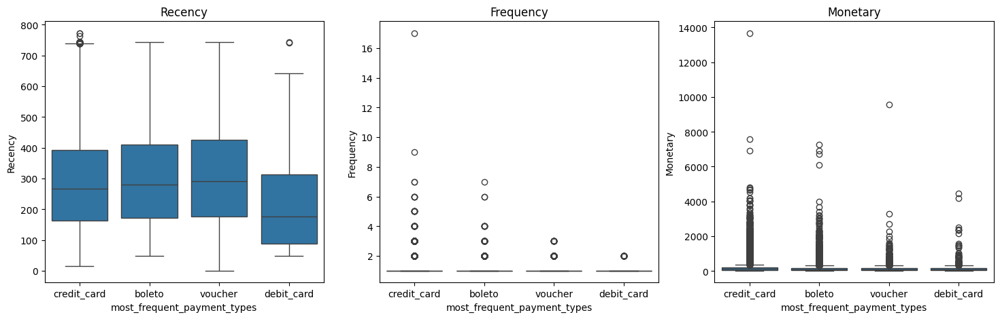

In [24]:
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
sns.boxplot(x='most_frequent_payment_types', y='Recency', data=paymethod_rfm)
plt.title('Recency')

plt.subplot(1, 3, 2)
sns.boxplot(x='most_frequent_payment_types', y='Frequency', data=paymethod_rfm)
plt.title('Frequency')

plt.subplot(1, 3, 3)
sns.boxplot(x='most_frequent_payment_types', y='Monetary', data=paymethod_rfm)
plt.title('Monetary')

#### check Assumptions of ANOVA

<Axes: xlabel='Monetary', ylabel='Density'>

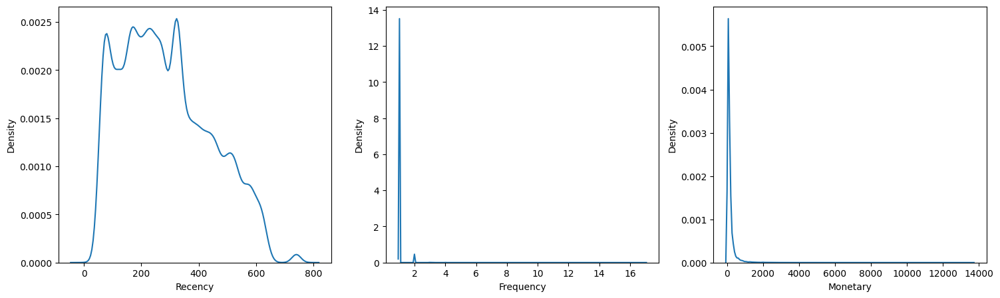

In [26]:
# Draw KDEs for Recency, Frequency, and Monetary

plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
sns.kdeplot(data=paymethod_rfm, x="Recency")
plt.subplot(1, 3, 2)
sns.kdeplot(data=paymethod_rfm, x="Frequency")
plt.subplot(1, 3, 3)
sns.kdeplot(data=paymethod_rfm, x="Monetary")

Since the distributions of Recency, Frequency and Monetary are far from Normal, we used box-cox transformation

#### Box-cox Transformation Attempt

In [27]:
paymethod_rfm['Recency_boxcox'], _ = boxcox(paymethod_rfm['Recency'] + 0.00001)
paymethod_rfm['Frequency_boxcox'], _ = boxcox(paymethod_rfm['Frequency'] + 0.00001)
paymethod_rfm['Monetary_boxcox'], _ = boxcox(paymethod_rfm['Monetary'] + 0.00001)

<Axes: xlabel='Monetary_boxcox', ylabel='Density'>

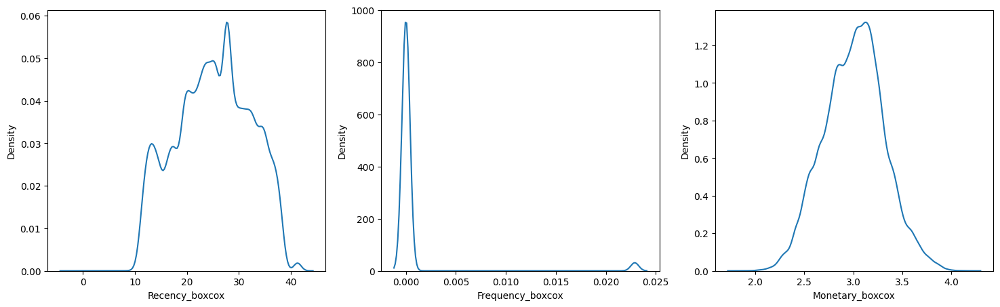

In [28]:
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
sns.kdeplot(data=paymethod_rfm, x="Recency_boxcox")
plt.subplot(1, 3, 2)
sns.kdeplot(data=paymethod_rfm, x="Frequency_boxcox")
plt.subplot(1, 3, 3)
sns.kdeplot(data=paymethod_rfm, x="Monetary_boxcox")

Since the distribution is still far from Normal, we decide to use Kruskal-Wallis H test

#### Kruskal-Wallis H test

Null Hypothesis (H0): The population medians of all 4 payment method preference groups  are equal. This means there is no statistically significant difference across the different groups.  
Alternative Hypothesis (Ha): At least one group's population medians is different from the others. This suggests that there is a statistically significant difference in at least one group when compared to the others.  

In [146]:
# use kruskal-wallis test to compare different preference of payment methods for Recency

stat6, p6 = kruskal(paymethod_rfm.query('most_frequent_payment_types == "credit_card"').Recency, paymethod_rfm.query('most_frequent_payment_types == "boleto"').Recency, paymethod_rfm.query('most_frequent_payment_types == "voucher"').Recency, paymethod_rfm.query('most_frequent_payment_types == "debit_card"').Recency)
print('Kruskal-Wallis H test statistic:', stat6)
print('P-value:', p6)

Kruskal-Wallis H test statistic: 491.0272189355074
P-value: 4.1992216215772677e-106


In [147]:
# use kruskal-wallis test to compare different preference of payment methods for Frequency

stat7, p7 = kruskal(paymethod_rfm.query('most_frequent_payment_types == "credit_card"').Frequency, paymethod_rfm.query('most_frequent_payment_types == "boleto"').Frequency, paymethod_rfm.query('most_frequent_payment_types == "voucher"').Frequency, paymethod_rfm.query('most_frequent_payment_types == "debit_card"').Frequency)
print('Kruskal-Wallis H test statistic:', stat7)
print('P-value:', p7)

Kruskal-Wallis H test statistic: 15813.0109716277
P-value: 0.0


In [148]:
# use kruskal-wallis test to compare different preference of payment methods for Monetary

stat8, p8 = kruskal(paymethod_rfm.query('most_frequent_payment_types == "credit_card"').Monetary, paymethod_rfm.query('most_frequent_payment_types == "boleto"').Monetary, paymethod_rfm.query('most_frequent_payment_types == "voucher"').Monetary, paymethod_rfm.query('most_frequent_payment_types == "debit_card"').Monetary)
print('Kruskal-Wallis H test statistic:', stat8)
print('P-value:', p8)

Kruskal-Wallis H test statistic: 738.0841259710446
P-value: 1.157840311296859e-159


#### Conclusion
Since p-values are all < 0.05, the difference of customer RFM between 4 payment method preference groups is significant. Based on the boxplot, we notice that there are more high-frequency and high-monetary customers that have preference on credit card payment, and also, boleto-preferred customers represent a segment that should not be underestimated.  

Olist can design personalized offers or discounts based on the preferred payment method. For instance, offer cashback for customers preferring credit card payment to increase their frequency and monetary. For customers preferring boleto, Olist can streamline the boleto payment UI, and also possibly offer extended payment deadlines since some of boleto customers may be unbanked and have been on tight budget.


## V.4. Multivariate Analysis

In [129]:
customer_agg.head()

,customer_unique_id,avg_review_score,order_counts,review_score_counts,review_comment_counts,rating_rate,comment_rate,most_frequent_payment_types,n_payment_types,average_payment_value,average_order_value,most_frequent_product_category,product_category_group,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,1,1,1,1.0,1.0,credit_card,1,141.90,141.90,bed_bath_table,Home & Living,2018-05-10 10:56:27,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,1,1,0,1.0,0.0,credit_card,1,27.19,27.19,health_beauty,Beauty & Fashion,2018-05-07 11:11:27,163,1,27.19
2,0000f46a3911fa3c0805444483337064,3.0,1,1,0,1.0,0.0,credit_card,1,86.22,86.22,stationery,Tools,2017-03-10 21:05:03,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,1,1,1,1.0,1.0,credit_card,1,43.62,43.62,telephony,Electronics,2017-10-12 20:29:41,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,5.0,1,1,0,1.0,0.0,credit_card,1,196.89,196.89,telephony,Electronics,2017-11-14 19:45:42,336,1,196.89


### V.4.1. Data Manipulation

In [130]:
## drop useless
customer_agg.drop(['order_counts',
       'review_score_counts', 'review_comment_counts','order_purchase_timestamp'], axis=1, inplace=True)

In [131]:
## drop missing
customer_agg_msno = customer_agg.dropna()
customer_agg_msno = customer_agg_msno[(customer_agg_msno.product_category_group != 'Missing') & (customer_agg_msno.most_frequent_payment_types != 'not_defined')]

In [132]:
## convert categorical to dummies
customer_agg_dummies = pd.concat([customer_agg_msno, pd.get_dummies(customer_agg_msno[['most_frequent_payment_types', 'product_category_group']])], axis=1)

### V.4.2. Check Correlation

<Axes: >

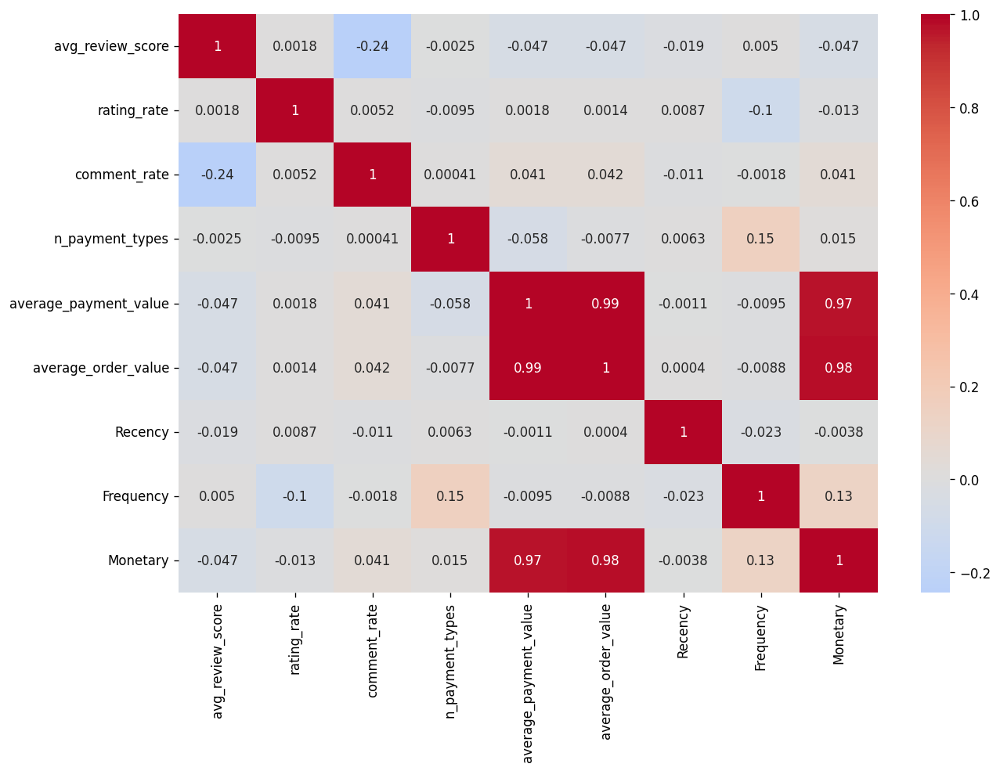

In [133]:
plt.figure(figsize=(12, 8))
sns.heatmap(customer_agg_msno[['avg_review_score', 'rating_rate','comment_rate', 
                          'n_payment_types',
                          'average_payment_value', 'average_order_value',
                          'Recency', 'Frequency', 'Monetary']].corr(), annot=True, cmap='coolwarm', center=0)

<Axes: >

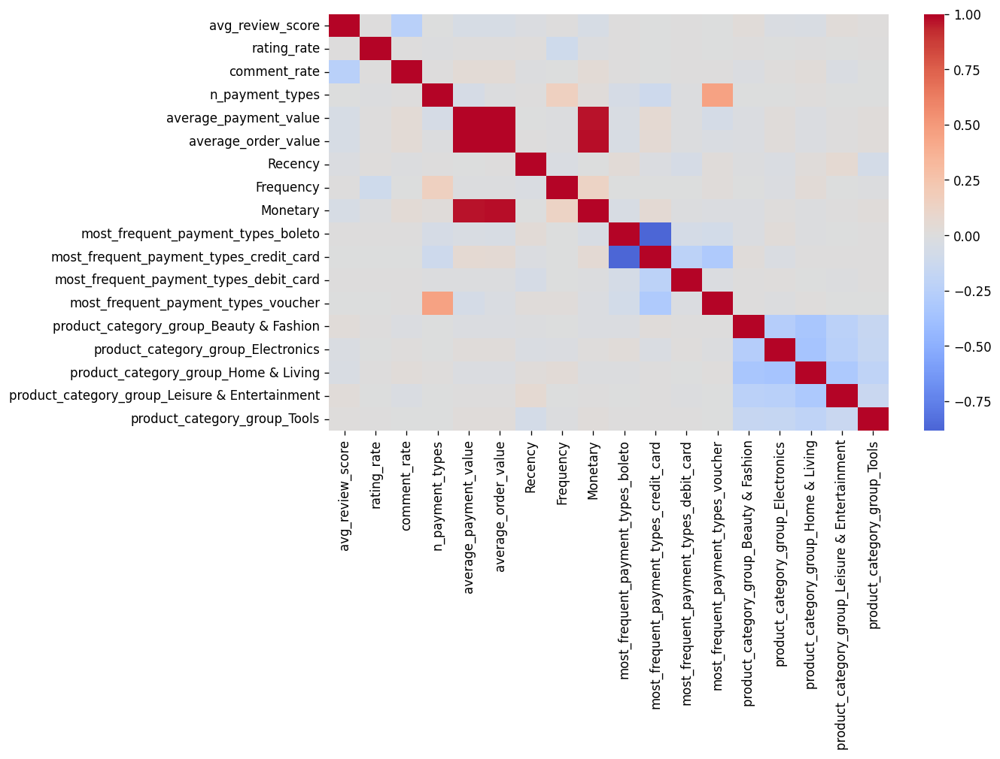

In [134]:
sns.heatmap(customer_agg_dummies.drop(['customer_unique_id','most_frequent_payment_types','most_frequent_product_category', 'product_category_group'], axis=1).corr(), annot=False, cmap='coolwarm', center=0)

#### Summary  

* average_payment_value is highly correlated with average_order_value, since most of the customers only purchased one item in each of their orders. Therefore, we should only choose one of them to use as predictor in regression analysis, to avoid multicolinearity.  
  
* average_payment_value is highly correlated with Monetary, since most of the customers only purchased once on Olist in our data.  
  
* Frequency is positively correlated with n_payment_types with correlation~0.5, since a large proportion of customers (from IV.1., 94%) only purchased once on Olist in our data, and no wonder they only use one payment type. Still, the correlation is not near 1, indicating that they could be some more patterns between customer's payment method diversity and customer purchase frequency, which is helpful in analyzing customer LTV in our subsequent work.  
  
* n_payment_types is positively correlated with most_frequent_payment_types_voucher with correlation~0.5, meaning that customer's preference of using vouchers may indicate their diversity of payment method. That would reveal a segment of customers who exhibit higher diversity in their choice of payment methods, while also responding positively to promotions and discount activities, indicating their loyalty and high purchasing power.  
  
* most_frequent_payment_types_credit_card is negatively correlated with most_frequent_payment_types_boleto, which means Brazilian customers showed a polarized preference for credit cards and boletos. As we mentioned before, boletos provide a convenient way of payment especially for customers without bank account. Thus, this polarization reflects a complex phenomenon that encompasses the availability of financial knowledge and services, credit conditions and concerns about security & privacy, as well as a combination of cultural and economic factors, which is important for LTV prediction and segmentation.  

### V.4.3. Investigate possible factors that influences Average Payment Value

In [137]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [138]:
customer_agg_msno.head()

,customer_unique_id,avg_review_score,rating_rate,comment_rate,most_frequent_payment_types,n_payment_types,average_payment_value,average_order_value,most_frequent_product_category,product_category_group,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,1.0,1.0,credit_card,1,141.90,141.90,bed_bath_table,Home & Living,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,1.0,0.0,credit_card,1,27.19,27.19,health_beauty,Beauty & Fashion,163,1,27.19
2,0000f46a3911fa3c0805444483337064,3.0,1.0,0.0,credit_card,1,86.22,86.22,stationery,Tools,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,1.0,1.0,credit_card,1,43.62,43.62,telephony,Electronics,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,5.0,1.0,0.0,credit_card,1,196.89,196.89,telephony,Electronics,336,1,196.89


In [139]:
customer_agg_msno.info()
## no missing values

<class 'pandas.core.frame.DataFrame'>
Index: 93137 entries, 0 to 95825
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   customer_unique_id              93137 non-null  object 
 1   avg_review_score                93137 non-null  float64
 2   rating_rate                     93137 non-null  float64
 3   comment_rate                    93137 non-null  float64
 4   most_frequent_payment_types     93137 non-null  object 
 5   n_payment_types                 93137 non-null  int64  
 6   average_payment_value           93137 non-null  float64
 7   average_order_value             93137 non-null  float64
 8   most_frequent_product_category  93137 non-null  object 
 9   product_category_group          93137 non-null  object 
 10  Recency                         93137 non-null  int64  
 11  Frequency                       93137 non-null  int64  
 12  Monetary                        93137

#### check Multicollinearity

In [140]:
predictors = customer_agg_msno.drop(['customer_unique_id',
                                               'most_frequent_payment_types','most_frequent_product_category', 'product_category_group',
                                               'average_order_value','average_payment_value'], axis=1)
predictors = predictors.astype({col: 'int' for col in predictors.columns if predictors[col].dtype == 'bool'})

## only check numerical features


In [141]:
predictors.head()

,avg_review_score,rating_rate,comment_rate,n_payment_types,Recency,Frequency,Monetary
0,5.0,1.0,1.0,1,160,1,141.90
1,4.0,1.0,0.0,1,163,1,27.19
2,3.0,1.0,0.0,1,585,1,86.22
3,4.0,1.0,1.0,1,369,1,43.62
4,5.0,1.0,0.0,1,336,1,196.89


In [142]:
num_predictors = predictors[['avg_review_score', 'rating_rate', 'comment_rate', 'n_payment_types', 'Recency', 'Frequency', 'Monetary']]

In [143]:
# check Multicollinearity of numerical variables 
## Note that categorical variables are always multicollinear with each other since they add up to 1

from statsmodels.stats.outliers_influence import variance_inflation_factor

X = sm.add_constant(num_predictors)

# Calculating VIF for each independent variable
vif = pd.DataFrame()
vif["Variable"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif)

           Variable          VIF
0             const  9780.827034
1  avg_review_score     1.065299
2       rating_rate     1.011007
3      comment_rate     1.064450
4   n_payment_types     1.023768
5           Recency     1.001302
6         Frequency     1.052486
7          Monetary     1.020181


Conclusion for Multicollinearity: Seems that there is no Multicollinearity in numerical variables, since all VIF's are within 2

#### Variable Transformation
Since the dependent variable `average_payment_value` is extremely right_skewed, we need to transform it so that its distribution approximate the normal distribution

In [144]:
from scipy.stats import boxcox

customer_agg_msno['average_payment_value_boxcox'], _ = boxcox(customer_agg_msno['average_payment_value'] + 0.00001)  ## add 0.00001 to deal with 0 value

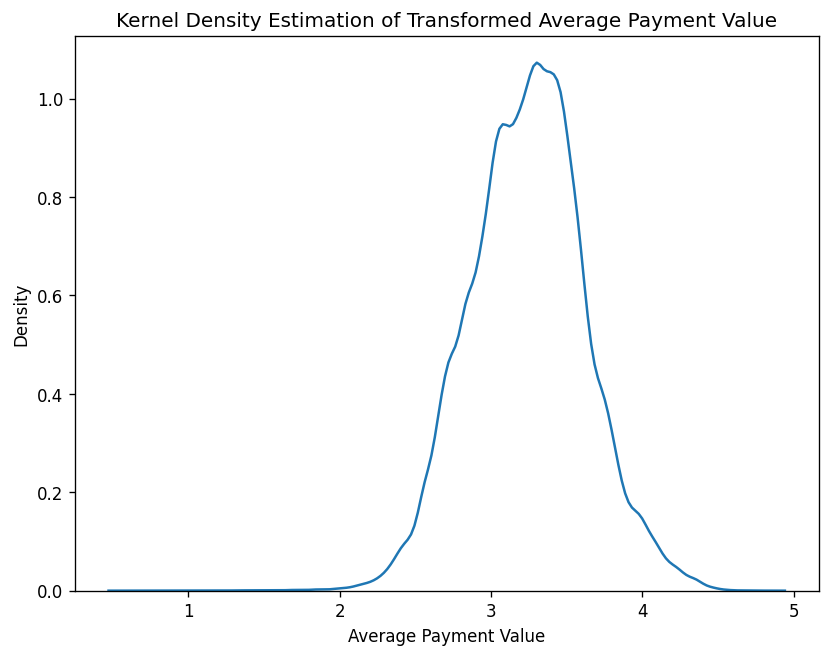

In [145]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=customer_agg_msno, x='average_payment_value_boxcox')
plt.xlabel('Average Payment Value')
plt.ylabel('Density')
plt.title('Kernel Density Estimation of Transformed Average Payment Value')
plt.show()


((array([-4.33039207, -4.13093273, -4.02242054, ...,  4.02242054,
          4.13093273,  4.33039207]),
  array([0.58858091, 0.81956293, 1.05054937, ..., 4.67490352, 4.68631583,
         4.82620756])),
 (0.3767561963026546, 3.241841882772568, 0.999233582544511))

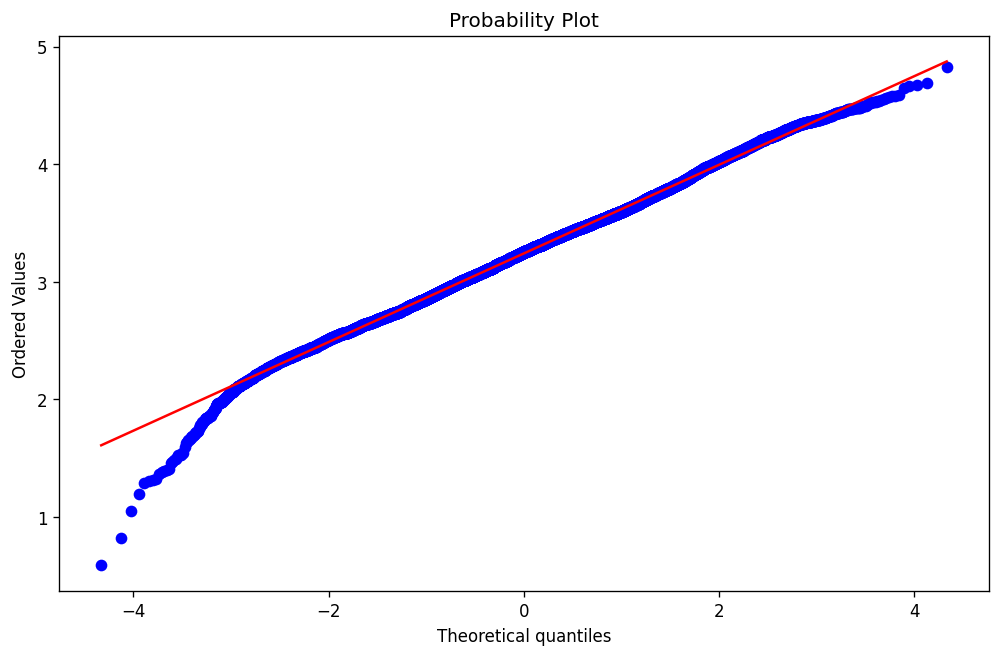

In [146]:
import scipy.stats as stats

stats.probplot(customer_agg_msno.average_payment_value_boxcox, dist="norm", plot=plt)

From the above KDE and QQ-plot, we can assume that the transformed average_payment_value is approximately normal, only a bit left-skewed

#### Build linear regression
Note we do not include `Monetary` in predictors, because Monetary is highly correlated with average payment value, and it can not be a 'factor' that influences average payment value (they are most of the time, the same value, siince most customers only purchased once)  


In [147]:
lm_no_boxcox = smf.ols('average_payment_value ~ avg_review_score + rating_rate + comment_rate + n_payment_types + Recency + Frequency\
             + C(most_frequent_payment_types) + C(product_category_group)', data=customer_agg_msno).fit()
lm_no_boxcox.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     average_payment_value   R-squared:                       0.011
Model:                               OLS   Adj. R-squared:                  0.011
Method:                    Least Squares   F-statistic:                     78.26
Date:                   Mon, 18 Mar 2024   Prob (F-statistic):          4.76e-208
Time:                           01:22:07   Log-Likelihood:            -6.3280e+05
No. Observations:                  93137   AIC:                         1.266e+06
Df Residuals:                      93123   BIC:                         1.266e+06
Df Model:                             13                                         
Covariance Type:               nonrobust                                         
========================================================================================================================
                                                           coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
Intercept                                              183.0903     70.066      2.613      0.009      45.761     320.420
C(most_frequent_payment_types)[T.credit_card]           22.0233      1.784     12.344      0.000      18.526      25.520
C(most_frequent_payment_types)[T.debit_card]            -1.0745      5.920     -0.182      0.856     -12.677      10.528
C(most_frequent_payment_types)[T.voucher]              -42.9728      5.084     -8.453      0.000     -52.937     -33.009
C(product_category_group)[T.Electronics]                13.0582      2.177      5.999      0.000       8.792      17.324
C(product_category_group)[T.Home & Living]               1.2391      2.014      0.615      0.538      -2.708       5.186
C(product_category_group)[T.Leisure & Entertainment]    10.4435      2.302      4.536      0.000       5.931      14.956
C(product_category_group)[T.Tools]                      19.3186      2.862      6.750      0.000      13.709      24.928
avg_review_score                                        -6.4393      0.552    -11.671      0.000      -7.521      -5.358
rating_rate                                             26.7108     69.459      0.385      0.701    -109.427     162.849
comment_rate                                            14.1784      1.481      9.573      0.000      11.275      17.081
n_payment_types                                        -50.5450      4.955    -10.200      0.000     -60.258     -40.832
Recency                                                  0.0019      0.005      0.416      0.677      -0.007       0.011
Frequency                                               -1.9769      3.330     -0.594      0.553      -8.504       4.550
==============================================================================
Omnibus:                   143965.533   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        253025541.144
Skew:                           9.332   Prob(JB):                         0.00
Kurtosis:                     257.662   Cond. No.                     4.52e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.52e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [148]:
lm = smf.ols('average_payment_value_boxcox ~ avg_review_score + rating_rate + comment_rate + n_payment_types + Recency + Frequency\
             + C(most_frequent_payment_types) + C(product_category_group)', data=customer_agg_msno).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                 
========================================================================================
Dep. Variable:     average_payment_value_boxcox   R-squared:                       0.052
Model:                                      OLS   Adj. R-squared:                  0.052
Method:                           Least Squares   F-statistic:                     390.7
Date:                          Mon, 18 Mar 2024   Prob (F-statistic):               0.00
Time:                                  01:22:08   Log-Likelihood:                -38833.
No. Observations:                         93137   AIC:                         7.769e+04
Df Residuals:                             93123   BIC:                         7.783e+04
Df Model:                                    13                                         
Covariance Type:                      nonrobust                                         
========================================================================================================================
                                                           coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
Intercept                                                3.4739      0.119     29.171      0.000       3.241       3.707
C(most_frequent_payment_types)[T.credit_card]            0.0612      0.003     20.178      0.000       0.055       0.067
C(most_frequent_payment_types)[T.debit_card]            -0.0211      0.010     -2.102      0.036      -0.041      -0.001
C(most_frequent_payment_types)[T.voucher]               -0.2407      0.009    -27.862      0.000      -0.258      -0.224
C(product_category_group)[T.Electronics]                -0.0514      0.004    -13.885      0.000      -0.059      -0.044
C(product_category_group)[T.Home & Living]               0.0146      0.003      4.259      0.000       0.008       0.021
C(product_category_group)[T.Leisure & Entertainment]     0.0343      0.004      8.756      0.000       0.027       0.042
C(product_category_group)[T.Tools]                       0.0185      0.005      3.799      0.000       0.009       0.028
avg_review_score                                        -0.0136      0.001    -14.486      0.000      -0.015      -0.012
rating_rate                                             -0.0325      0.118     -0.275      0.783      -0.264       0.199
comment_rate                                             0.0343      0.003     13.614      0.000       0.029       0.039
n_payment_types                                         -0.2270      0.008    -26.946      0.000      -0.243      -0.210
Recency                                              -2.633e-05   7.91e-06     -3.329      0.001   -4.18e-05   -1.08e-05
Frequency                                                0.0402      0.006      7.103      0.000       0.029       0.051
==============================================================================
Omnibus:                      253.883   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              256.836
Skew:                           0.124   Prob(JB):                     1.69e-56
Kurtosis:                       3.071   Cond. No.                     4.52e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.52e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

the R-square is very low, indicating that the performance of linear regression on the raw data is poor. However, it was improved from 0.011 to 0.056 after boxcox transformation of the dependent variable, indicating the significance of boxcox.

#### check linear assumptions
* independence: all datapoints are independent  
* linearity: E(residual|x) = 0  
* homoscedasiticity: Var(residual) = constant  
* normality (do not have to strictly obey)

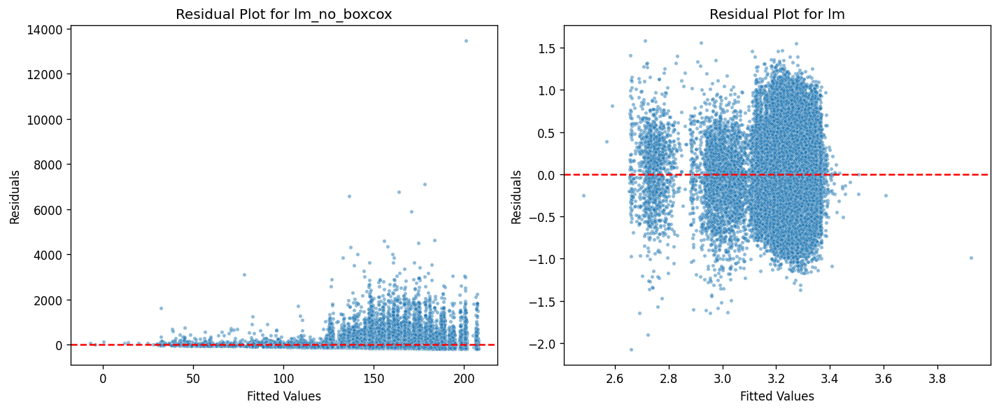

In [149]:
# Residual plot for lm_no_boxcox
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.scatterplot(x=lm_no_boxcox.fittedvalues, y=lm_no_boxcox.resid,s=10, alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot for lm_no_boxcox')

# Residual plot for lm
plt.subplot(1, 2, 2)
sns.scatterplot(x=lm.fittedvalues, y=lm.resid,s=10, alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot for lm')

plt.tight_layout()
plt.show()


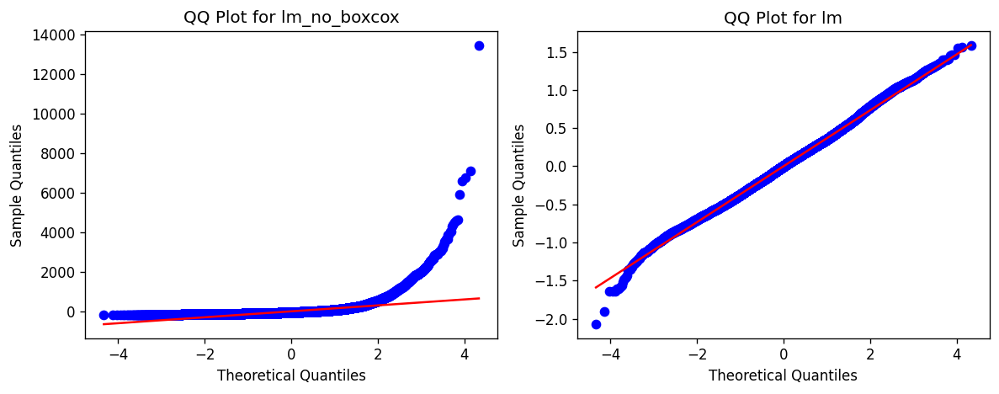

In [150]:
import scipy.stats as stats

plt.figure(figsize=(10, 4))

# QQ plot for lm_no_boxcox
plt.subplot(1, 2, 1)
stats.probplot(lm_no_boxcox.resid, dist="norm", plot=plt)
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.title('QQ Plot for lm_no_boxcox')

# QQ plot for lm
plt.subplot(1, 2, 2)
stats.probplot(lm.resid, dist="norm", plot=plt)
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.title('QQ Plot for lm')

plt.tight_layout()
plt.show()


#### Deal with heteroscedasticity

From the above residual plots and QQ-plots, we can see that after boxcox transformation, the normality is strongly improved, and also, the linearity is strongly corrected, heteroscedasticity is also improved. The only problem is that there is still heteroscedasticity.  
We tried HC, which can mitigate the impact of heteroscedasticity on statistical inference, so that even if there is heteroscedasticity, we can still analyze the statistical significance of predictors, and tell whether a predictor is positively or negatively correlated with our dependent variable.

In [151]:
lm_hc = smf.ols('average_payment_value_boxcox ~ avg_review_score + rating_rate + comment_rate + n_payment_types + Recency + Frequency\
             + C(most_frequent_payment_types) + C(product_category_group)', data=customer_agg_msno).fit(cov_type='HC2')
lm_hc.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                 
========================================================================================
Dep. Variable:     average_payment_value_boxcox   R-squared:                       0.052
Model:                                      OLS   Adj. R-squared:                  0.052
Method:                           Least Squares   F-statistic:                     293.1
Date:                          Mon, 18 Mar 2024   Prob (F-statistic):               0.00
Time:                                  01:22:10   Log-Likelihood:                -38833.
No. Observations:                         93137   AIC:                         7.769e+04
Df Residuals:                             93123   BIC:                         7.783e+04
Df Model:                                    13                                         
Covariance Type:                            HC2                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
Intercept                                                3.4739      0.102     34.201      0.000       3.275       3.673
C(most_frequent_payment_types)[T.credit_card]            0.0612      0.003     20.412      0.000       0.055       0.067
C(most_frequent_payment_types)[T.debit_card]            -0.0211      0.010     -2.083      0.037      -0.041      -0.001
C(most_frequent_payment_types)[T.voucher]               -0.2407      0.011    -22.922      0.000      -0.261      -0.220
C(product_category_group)[T.Electronics]                -0.0514      0.004    -13.030      0.000      -0.059      -0.044
C(product_category_group)[T.Home & Living]               0.0146      0.003      4.494      0.000       0.008       0.021
C(product_category_group)[T.Leisure & Entertainment]     0.0343      0.004      9.213      0.000       0.027       0.042
C(product_category_group)[T.Tools]                       0.0185      0.005      3.759      0.000       0.009       0.028
avg_review_score                                        -0.0136      0.001    -14.200      0.000      -0.015      -0.012
rating_rate                                             -0.0325      0.100     -0.325      0.745      -0.229       0.164
comment_rate                                             0.0343      0.003     13.594      0.000       0.029       0.039
n_payment_types                                         -0.2270      0.010    -22.859      0.000      -0.246      -0.207
Recency                                              -2.633e-05   8.05e-06     -3.273      0.001   -4.21e-05   -1.06e-05
Frequency                                                0.0402      0.006      6.314      0.000       0.028       0.053
==============================================================================
Omnibus:                      253.883   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              256.836
Skew:                           0.124   Prob(JB):                     1.69e-56
Kurtosis:                       3.071   Cond. No.                     4.52e+04
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC2)
[2] The condition number is large, 4.52e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Summary

From lm_hc, we can see that all of the predictors have p-value < 0.05 except rating rate, indicating that all predictors except rating rate are significant on the boxcox transformed value of average payment method.  
  
Based on the coef's, we find that comment rate is positively correlated with average payment value. This is easy to understand, since people who are more willing to compose a comment are more possibly loyal customers, possibly indicating they purchase power.  
  
Other numerical predictors all seem to be negatively correlated with average payment value, which cannot be understood superficially, but it can provide hints for subsequent LTV prediction.  
  
For most_frequent_payment_types, boleto is used as the reference class. We can see that credit card has a larger positive impact compared to boleto, whereas other payment methods contribute less positively compared to boleto. That’s possibly because of credit card’s flexibility and convenience especially in terms of large amount payment.  
  
For most frequently bought product category, Beauty&Fashion is used as the reference class. We can see that preference for Electronics contribute less positively compared to preference for Beauty&Fashion, while preference for other categories have larger positive impact compared to Beauty&Fashion. Since Olist primarily serves small businesses, it’s likely that people prefer to buy lower-value stuff against electronics, mainly because they may focus more on the quality of electronics rather than the price, and thus many would choose to purchase electronics on larger platforms such as Amazon. Based on that, Olist can propose more targeted marketing strategies, such as focusing more on lower-value items.  

This multivariate analysis can not only provide insights in feature selection for subsequent machine learning research , but also help in prioritizing improvement efforts.




## V.5. Synthesis

In Project II (section III. & V.), we first conducted feature engineering in section III, constructing several potentially useful features for subsequent statistical analysis, customer segmentation and LTV prediction, including RFM values, review features, payment features, and product features, which could be indicative of customer purchase preference and customer LTV.  

In section V.1., we looked at the descriptive statistics of the engineered features, some of which are continuous numerical features, some discrete numerical, and some categorical, where we gained an overview of the distributions of all features, summarized noticeable patterns such as skewness and imbalance, using the descriptive statistics and data visualization, that shed light on how to choose the statistical methods appropriately in subsequent analysis. For example, the extreme right-skewness of RFM features deviates from the assumptions of ANOVA, thereby requires modification of data or adjustments of methods.  

In section V.2., we analyzed customer’s purchase preference in time dimension, by investigating the influence of time of day and day of week on the number of orders each customer placed, and also the correlation between these two categorical time factors. Results show that both the time of day and day of week are significant on customer’s purchase preference, and there is a correlation between time of day and day of week in terms of customer purchase preference. Based on this, Olist can improve its revenue in several aspects, including websites availability allocation, marketing campaign timing, and also exploiting the weekend potentials.  

In section V.3., we compared the RFM value of different subsets of customers based on customer geolocation and payment method preference. Results show that there are significant differences in RFM distribution across different subsets, which could provide hints on customer segmentation. This enables more customized marketing campaigns and more personalized product recommendations for different subsets of customers.
In section V.4., we first checked the correlations between the derived features, providing insights into subsequent machine learning research. Also, we investigated possible features that could influence the average payment value of customers, through multivariate linear regression. From the p-value and coefficients of all possible predictors, we derived their significance on the response and also whether they positively or negatively influence the response, which would help in prioritizing improvement efforts for Olist.  

To sum up, Project II provides a comprehensive statistical analysis of our customer-wise data, where we extracted data-driven insights into customer purchase preference and customer segmentation, and derived actionable strategies to improve revenue.


## V.6. Reflection

From V.1. descriptive statistics, we analyzed the customer's purchase frequency and found that most of the customers only have a single purchase record, which means the data is very sparse, making it difficult to accurately analyze their purchase preferences in the subsequent analysis. Initially, we planned to use ANOVA to explore whether there are differences in customers' purchase preferences in different time periods. However, due to the sparsity, our data is extremely right-skewed, and the assumptions of ANOVA, normality and homoscedasticity, were violated, making ANOVA inapplicable.  

Therefore, we tried to transform the data so that it meets the assumptions of ANOVA. We tried the Box-cox transformation, but the transformed data is still far from normal. Also, the transformed frequency data is multimodal. This is actually a side effect of the transformation process, because when trying to correct a skew, Box-Cox transformation may introduce other types of distribution characteristics, such as multimodality. This multimodality is not a feature in the original data, but is introduced during the transformation process.  

Since traditional analysis of variance (ANOVA) was not appropriate for our data, we turned to Kruskal-Wallis Hypothesis test instead. The Kruskal-Wallis Hypothesis test is a nonparametric method that does not require the normal distribution of the data and the assumption of homoscedasticity. Therefore, the Kruskal-Wallis Hypothesis test usually performs better when dealing with skewed data just like ours. The Kruskal-Wallis Hypothesis test evaluates whether the medians of different groups are equal, not the means, making it suitable for data sets where the shape of the distribution is unknown or unevenly distributed.  

However, compared to parametric tests, nonparametric methods do not fully utilize the information in the data because they only focus on the ranking of values instead of the exact number of values. And thus, the results of nonparametric tests may be less intuitive and understandable than parametric tests because they do not rely on an explicit distribution model.  

To fully utilize the data, we can try on other methods to transform our right-skewed data, such as the Yeo-Johnson transformation and logarithmic transformation. We haven’t tried out these methods yet because of time limitation, but these are indeed possible ways to improve our analysis. If any of this transformations could transform our data to be approximately normal, then we can apply ANOVA on the transformed data, and provide a more detailed and quantified analysis compared with non-parametric testing.